In [37]:
%matplotlib notebook

In [38]:
import autograd.numpy as np
import matplotlib.pyplot as plt
import celerite
from celerite import terms
import emcee
import corner
from scipy import signal
from IPython.display import display, Math, Image
import os
from astropy.io import fits
import pandas as pd

In [39]:
dir = os.getcwd()
dir

'C:\\Users\\Marc\\Documents\\repo\\stage_m2\\src'

In [40]:
par_dir = os.path.dirname(dir)
par_dir

'C:\\Users\\Marc\\Documents\\repo\\stage_m2'

In [50]:
def log_likelihood(params,time,flux):
        gp.set_parameter_vector(params)
        ll = gp.log_likelihood(flux)
        return ll if np.isfinite(ll) else -np.inf

### Définition de la likelihood ###
def log_likelihood(params,time,flux):
    gp.set_parameter_vector(params)
    ll = gp.log_likelihood(flux)
    return ll if np.isfinite(ll) else -np.inf

### Définition du prior (uniforme) ###
def log_prior(params):
    if ((-30 < params[0] < 20) and (-10 < params[1] < 10) and (5 < params[2] < 7) and (-1000 < params[3] < 1000)) :
        return 0
    return -np.inf

### Définition du posterior ###
def log_probability(params,time,flux):
    lp = log_prior(params)
    if not np.isfinite(lp):
        return -np.inf
    return lp + log_likelihood(params,time,flux) if np.isfinite(lp) else -np.inf

    ### MCMC ###
def run_mcmc(time,flux,gp) :
    initial = gp.get_parameter_vector()
    ndim, nwalkers = len(initial), 128
    sampler = emcee.EnsembleSampler(nwalkers, ndim, log_probability,args=(time,flux))

    print("Running burn-in...")
    p0 = initial + 1e-8 * np.random.randn(nwalkers, ndim)
    p0, lp, _ = sampler.run_mcmc(p0, 1500,progress=True)

    print("Running production...")
    sampler.reset()
    sampler.run_mcmc(p0, 15000,progress=True)
    print("Finished")
    
    likelihood = gp.log_likelihood(flux)
    af = sampler.acceptance_fraction
    
    print("Mean acceptance fraction:", np.mean(af))
    print("parameter_dict:\n{0}\n".format(gp.get_parameter_dict()))
    print("Final MCMC log likelihood: {0}".format(gp.log_likelihood(flux)))
    return(sampler,likelihood)

In [42]:
def gp_building(param,time,flux,error) :
    bounds = dict(log_S0= (None,None), log_Q = (-10,10), log_omega0 = (5,7))
    #kernel = terms.SHOTerm(log_S0=7., log_Q=2.5, log_omega0=5.)
    kernel = terms.SHOTerm(log_S0=param[0], log_Q=param[1], log_omega0=param[2],bounds=bounds)


    gp = celerite.GP(kernel,fit_mean=True)
    gp.compute(time,yerr=error)
 
    print("Initial log likelihood: {0}".format(gp.log_likelihood(flux)))
    print("parameter_dict:\n{0}\n".format(gp.get_parameter_dict()))
    
    return gp

In [43]:
### DATA ###
photo_res = pd.read_csv(par_dir + "/data/Posteriors_photometries_new.csv").ffill().set_index(['Photometry','Sector'])

sectors_names = {
#     "TESS_18_19" : ["All","Sector1","Sector2","Sector3"],
#                  "TESS_18_0" : ["All"],
#                  "TESS_18_1" : ["All"],
#                  "TESS_18_2" : ["All"],
#                  "TESS_19" : ["All"],
                 "TESS_20_0" : ["All"]
#                  "TESS_20_1" : ["All","Sector1","Sector2"],
#                  "TESS_21" : ["All","Sector1","Sector2"]
}

# rv_time_plot_obs = np.array([544.4,780.71,799.71,829.66,851.32,913.54,1131.79,1170.70,1519.79,1566.70,1597.62,2569.81,2583.88,2685.70,2694.56,2707.08,2985.24,3344.74,3668.00,3712.63,3770.45,3849.51,4007.84,4037.19,4064.77,4094.64,4207.68,4233.60,4525.58,4787.42,4828.73,4907.33,4922.58])

In [44]:
photo_res

Likelihood     Log S0     Log Q    Log w0  Inc - S0  \
Photometry Sector                                                            
TESS_18_0  All     -142358.904981  12.586912  0.114582  5.571613  0.036583   
TESS_18_1  All     -145339.898760   8.883048  3.111981  5.754014  0.021142   
TESS_18_19 All      315081.836837 -21.057320  2.150781  5.764506  0.014603   
           Sector1  116041.275491 -21.748926  2.878606  5.757228  0.023285   
           Sector2   88085.140921 -20.880149  1.962393  5.766474  0.027147   
           Sector3  111674.889117 -20.618459  1.686964  5.773898  0.024183   
TESS_18_2  All     -126536.323325  10.034609  1.984541  5.746049  0.025430   
TESS_19    All     -139890.792582   9.871351  2.073424  5.766396  0.026127   
TESS_20_0  All     -143882.355319   8.857675  2.986948  5.743849  0.022156   
           Sector1  -68191.023702   8.899303  2.963890  5.745125  0.031996   
           Sector2  -75688.597169   8.821922  3.010460  5.742808  0.029019   
TESS_20_1  All     -144512.856166   9.041087  2.807812  5.734413  0.022733   
           Sector1  -70858.642004   8.675228  3.179812  5.734923  0.029536   
           Sector2  -73489.422684   9.475304  2.379903  5.735718  0.034932   
TESS_21    All     -144551.229765  10.390453  1.347725  5.765349  0.026494   
           Sector1  -70129.056946   8.924610  2.826671  5.737635  0.033573   
           Sector2  -72993.011999  11.078815  0.640480  5.801044  0.039682   

                    Inc + S0   Inc - Q   Inc + Q  Inc - w0  Inc + w0  \
Photometry Sector                                                      
TESS_18_0  All      0.037697  0.025896  0.025611  0.008730  0.008571   
TESS_18_1  All      0.021716  0.074893  0.082286  0.001712  0.001686   
TESS_18_19 All      0.014912  0.031441  0.032526  0.001679  0.001704   
           Sector1  0.023729  0.071066  0.075310  0.001943  0.001961   
           Sector2  0.026974  0.054328  0.056723  0.003562  0.003541   
           Sector3  0.023728  0.043370  0.044883  0.003569  0.003538   
TESS_18_2  All      0.025191  0.050681  0.053682  0.003258  0.003252   
TESS_19    All      0.026713  0.051706  0.052394  0.002945  0.003016   
TESS_20_0  All      0.022224  0.073258  0.078407  0.001795  0.001789   
           Sector1  0.031544  0.104536  0.111921  0.002690  0.002710   
           Sector2  0.029864  0.098423  0.110408  0.002488  0.002433   
TESS_20_1  All      0.023049  0.067325  0.070100  0.002017  0.002028   
           Sector1  0.029177  0.111492  0.124446  0.002309  0.002358   
           Sector2  0.035261  0.080235  0.085893  0.003477  0.003485   
TESS_21    All      0.025645  0.038335  0.038419  0.004310  0.004203   
           Sector1  0.034823  0.097070  0.104278  0.002853  0.002836   
           Sector2  0.039590  0.038647  0.039518  0.008574  0.008211   

                           RMS  
Photometry Sector               
TESS_18_0  All       99.694268  
TESS_18_1  All      242.030777  
TESS_18_19 All        0.000039  
           Sector1    0.000043  
           Sector2    0.000036  
           Sector3    0.000034  
TESS_18_2  All      212.453286  
TESS_19    All      222.929191  
TESS_20_0  All      239.951430  
           Sector1  238.669605  
           Sector2  236.806012  
TESS_20_1  All      243.100479  
           Sector1  232.909990  
           Sector2  243.185703  
TESS_21    All      189.232259  
           Sector1  250.084589  
           Sector2  132.051818

In [45]:
columns = ["Photometry","Sector","RV group","Likelihood","Log S0","Log Q","Log w0","Offset","Inc - S0","Inc + S0","Inc - Q","Inc + Q","Inc - w0","Inc + w0","Inc - Offset","Inc + Offset","RMS"]
rows = sectors_names.keys()
res = pd.DataFrame(columns=columns)
bnds = np.array([542.51,542.61,544.551,544.554,545.519,545.522,546.49,546.576,780.69,780.74,799.67,799.76,829.62,829.71,847.61,847.672,853.58,853.68,878.57,878.65,913.49,913.59,1131.71,1131.76,1131.83,1131.88,1170.67,1170.74,1519.75,1519.84,1565.63,1565.72,1567.67,1567.76,1597.58,1597.67,2569.77,2569.85,2580.79,2580.85,2583.82,2583.89,2584.84,2584.88,2685.67,2685.74,2694.53,2694.6,2706.52,2706.59,2707.58,2707.64,2773.46,2773.53,2980.82,2980.86,2982.83,2982.87,2988.69,2988.75,3040.55,3043.83,3333.85,3333.89,3344.73,3344.77,3492.46,3494.54,3666.80,3666.85,3668.74,3668.81,3711.69,3711.75,3712.68,3712.75,3713.84,3713.9,3768.51,3768.79,3769.71,3769.78,3770.55,3770.61,3771.67,3771.73,3772.59,3772.66,3773.64,3773.71,3774.75,3774.81,3849.46,3849.56,3905.44,3905.46,4007.8,4007.9,4035.67,4035.92,4036.68,4036.92,4038.66,4038.91,4039.66,4039.88,4064.71,4064.82,4093.5,4093.89,4094.57,4094.9,4095.52,4095.9,4206.48,4206.64,4207.5,4207.64,4208.48,4208.63,4226.47,4226.58,4227.48,4227.58,4228.45,4228.58,4229.46,4229.58,4230.46,4230.57,4231.46,4231.57,4238.47,4238.55,4239.5,4239.54,4242.45,4242.54,4243.45,4243.54,4244.45,4244.53,4525.52,4525.67,4786.61,4786.88,4787.62,4787.78,4789.61,4789.64,4827.60,4827.86,4828.58,4828.85,4829.6,4829.85,4905.5,4905.59,4906.5,4906.58,4908.51,4908.58,4909.52,4909.57,4921.49,4921.68,4922.49,4922.62,4923.49,4923.68])
rv_data = np.loadtxt(par_dir + "/data/rv_betapic_carine.txt",usecols=(0,1,2))
rv_time = rv_data[:,0]
rv_time_plot_ind = np.array([])
for key in sectors_names.keys() :
    for name in sectors_names[key] :
        for j in range(np.int(len(bnds)/2)) :
            index = np.argwhere((rv_time>bnds[j*2])&(rv_time<bnds[(j*2)+1]))
            rv_time_plot = np.mean(np.sort(np.ndarray.flatten(rv_time[index])))
            df2 = pd.DataFrame([[key,name,rv_time_plot],[]],columns=['Photometry','Sector','RV group'])
            res = res.append(df2.loc[0])
            rv_time_plot_ind = np.append(rv_time_plot_ind,rv_time_plot)
res.set_index(["Photometry","Sector","RV group"],inplace=True)
res.sort_index(inplace=True)
res

Likelihood  Log S0  Log Q  Log w0  Offset  \
Photometry Sector RV group                                                 
TESS_20_0  All    542.560166          NaN     NaN    NaN     NaN     NaN   
                  544.552394          NaN     NaN    NaN     NaN     NaN   
                  545.520343          NaN     NaN    NaN     NaN     NaN   
                  546.536144          NaN     NaN    NaN     NaN     NaN   
                  780.715065          NaN     NaN    NaN     NaN     NaN   
...                                   ...     ...    ...     ...     ...   
                  4908.546903         NaN     NaN    NaN     NaN     NaN   
                  4909.548217         NaN     NaN    NaN     NaN     NaN   
                  4921.581292         NaN     NaN    NaN     NaN     NaN   
                  4922.540740         NaN     NaN    NaN     NaN     NaN   
                  4923.575618         NaN     NaN    NaN     NaN     NaN   

                               Inc - S0  Inc + S0  Inc - Q  Inc + Q  Inc - w0  \
Photometry Sector RV group                                                      
TESS_20_0  All    542.560166        NaN       NaN      NaN      NaN       NaN   
                  544.552394        NaN       NaN      NaN      NaN       NaN   
                  545.520343        NaN       NaN      NaN      NaN       NaN   
                  546.536144        NaN       NaN      NaN      NaN       NaN   
                  780.715065        NaN       NaN      NaN      NaN       NaN   
...                                 ...       ...      ...      ...       ...   
                  4908.546903       NaN       NaN      NaN      NaN       NaN   
                  4909.548217       NaN       NaN      NaN      NaN       NaN   
                  4921.581292       NaN       NaN      NaN      NaN       NaN   
                  4922.540740       NaN       NaN      NaN      NaN       NaN   
                  4923.575618       NaN       NaN      NaN      NaN       NaN   

                               Inc + w0  Inc - Offset  Inc + Offset  RMS  
Photometry Sector RV group                                                
TESS_20_0  All    542.560166        NaN           NaN           NaN  NaN  
                  544.552394        NaN           NaN           NaN  NaN  
                  545.520343        NaN           NaN           NaN  NaN  
                  546.536144        NaN           NaN           NaN  NaN  
                  780.715065        NaN           NaN           NaN  NaN  
...                                 ...           ...           ...  ...  
                  4908.546903       NaN           NaN           NaN  NaN  
                  4909.548217       NaN           NaN           NaN  NaN  
                  4921.581292       NaN           NaN           NaN  NaN  
                  4922.540740       NaN           NaN           NaN  NaN  
                  4923.575618       NaN           NaN           NaN  NaN  

[85 rows x 14 columns]

In [51]:
# bnds = np.array([3320,3340,3492,3494,3666,3668,3711,3712,3713,3768,3769,3770,3771,3772,3773,3774,3849,3905,4007,4035,4036,4038,4039,4060,4093,4094,4095,4206,4207,4208,4226,4227,4228,4229,4230,4231,4238,4239,4242,4243,4244,4525,4786,4787,4789,4827,4828,4829,4905,4906,4908,4909,4921,4922,4923,4924])
bnds=np.array([542.51,542.61,544.551,544.554,545.519,545.522,546.49,546.576,780.69,780.74,799.67,799.76,829.62,829.71,847.61,847.672,853.58,853.68,878.57,878.65,913.49,913.59,1131.71,1131.76,1131.83,1131.88,1170.67,1170.74,1519.75,1519.84,1565.63,1565.72,1567.67,1567.76,1597.58,1597.67,2569.77,2569.85,2580.79,2580.85,2583.82,2583.89,2584.84,2584.88,2685.67,2685.74,2694.53,2694.6,2706.52,2706.59,2707.58,2707.64,2773.46,2773.53,2980.82,2980.86,2982.83,2982.87,2988.69,2988.75,3040.55,3043.83,3333.85,3333.89,3344.73,3344.77,3492.46,3494.54,3666.80,3666.85,3668.74,3668.81,3711.69,3711.75,3712.68,3712.75,3713.84,3713.9,3768.51,3768.79,3769.71,3769.78,3770.55,3770.61,3771.67,3771.73,3772.59,3772.66,3773.64,3773.71,3774.75,3774.81,3849.46,3849.56,3905.44,3905.46,4007.8,4007.9,4035.67,4035.92,4036.68,4036.92,4038.66,4038.91,4039.66,4039.88,4064.71,4064.82,4093.5,4093.89,4094.57,4094.9,4095.52,4095.9,4206.48,4206.64,4207.5,4207.64,4208.48,4208.63,4226.47,4226.58,4227.48,4227.58,4228.45,4228.58,4229.46,4229.58,4230.46,4230.57,4231.46,4231.57,4238.47,4238.55,4239.5,4239.54,4242.45,4242.54,4243.45,4243.54,4244.45,4244.53,4525.52,4525.67,4786.61,4786.88,4787.62,4787.78,4789.61,4789.64,4827.60,4827.86,4828.58,4828.85,4829.6,4829.85,4905.5,4905.59,4906.5,4906.58,4908.51,4908.58,4909.52,4909.57,4921.49,4921.68,4922.49,4922.62,4923.49,4923.68])
#A refaire pour 3712
for photometry in sectors_names.keys() :
    
    for name in sectors_names[photometry] :
        posteriors = photo_res.loc[(photometry,name),"Log S0":"Log w0"]
        
        for j in range(np.int(len(bnds)/2)) :
            print(photometry+"/"+name+"/ %.2f\n"%rv_time_plot_ind[j])
            rv_data = np.loadtxt(par_dir + "/data/rv_betapic_carine.txt",usecols=(0,1,2))
            rv_time = rv_data[:,0]
            rv_flux = rv_data[:,1]
            rv_error = rv_data[:,2]
            index = np.argwhere((rv_time>bnds[j*2])&(rv_time<bnds[(j*2)+1]))
            rv_flux = np.ndarray.flatten(rv_flux[index])*1000
            rv_time = np.sort(np.ndarray.flatten(rv_time[index]))
            rv_error = np.ndarray.flatten(rv_error[index])*1000
            
            
            gp = gp_building(posteriors,rv_time,rv_flux,rv_error)
            sampler,likelihood = run_mcmc(rv_time,rv_flux,gp)
            
            
            flat_samples = sampler.get_chain(discard = 500,thin=15, flat=True)
            labels = ["log(S0)","log(Q)","log(w0)","Offset"]

            rv_posteriors = np.array([])
            rv_posteriors_errors = np.array([])
            corner.corner(flat_samples, labels=labels, truths=[None,posteriors[1],posteriors[2],None])
            plt.title("Posteriors_MCMC_RV_%s_%s_%s"%(photometry,name,rv_time_plot_ind[j]))
            plt.savefig(par_dir + "/plots/%s/%s/ind/Posteriors_MCMC_RV_%s_%s_%s.pdf"%(photometry,name,photometry,name,rv_time_plot_ind[j]),bbox_inches='tight')
            plt.close()  
        #     plt.show()

#             not_flat_samplers = sampler.get_chain(discard = 500, thin=15,flat=False)
#             fig,ax = plt.subplots(2,2)
#             for i in range(not_flat_samplers.shape[2]) :
#                 for cpt in range(2) :
#                     for cpt_1 in range(2) :
#                         if cpt == 0 :
#                             ax[cpt,cpt_1].plot(not_flat_samplers[:,i,(cpt)+(cpt_1)],linewidth=0.5)
#                             ax[cpt,cpt_1].set_title(labels[(cpt)+(cpt_1)])
#                         if cpt == 1 :
#                             ax[cpt,cpt_1].plot(not_flat_samplers[:,i,(cpt)+(cpt_1+1)],linewidth=0.5)
#                             ax[cpt,cpt_1].set_title(labels[(cpt)+(cpt_1+1)])

#             plt.savefig(par_dir + "/plots/%s/%s/ind/Samplers_MCMC_RV_%s_%s_%s.pdf"%(photometry,name,photometry,name,rv_time_plot_obs[j]),bbox_inches='tight')
#             plt.close() 
        #     plt.show()
        
            x = np.linspace(np.min(rv_time),np.max(rv_time),15000)
            pred_mean, pred_var = gp.predict(rv_flux, x, return_var=True)
            pred_std = np.sqrt(pred_var)

            color = "#ff7f0e"
            plt.figure()
            plt.scatter(rv_time,rv_flux,s=1)
            plt.plot(x, pred_mean, color=color)
            plt.fill_between(x, pred_mean+pred_std, pred_mean-pred_std, color=color, alpha=0.3, edgecolor="none",interpolate=True)
            plt.xlabel("x")
            plt.ylabel("y")
            plt.ylim(np.min(rv_flux),np.max(rv_flux))
            plt.title("Fit_MCMC_RV_%s_%s_%s"%(photometry,name,rv_time_plot_ind[j]))
            plt.savefig(par_dir + "/plots/%s/%s/ind/Fit_MCMC_RV_%s_%s_%s.pdf"%(photometry,name,photometry,name,rv_time_plot_ind[j]),bbox_inches='tight')
            plt.close() 
            
            
            pred_mean, pred_var = gp.predict(rv_flux, rv_time, return_var=True)
            pred_std = np.sqrt(pred_var)
            
            plt.figure()
            plt.scatter(rv_time,rv_flux-pred_mean,s=1)
            plt.xlabel("Time")
            plt.ylabel("Residus")
            plt.title("Residus_MCMC_RV_%s_%s_%s"%(photometry,name,rv_time_plot_ind[j]))
            plt.savefig(par_dir + "/plots/%s/%s/ind/Residus_MCMC_RV_%s_%s_%s.pdf"%(photometry,name,photometry,name,rv_time_plot_ind[j]),bbox_inches='tight')
            plt.close()
            
            RMS = np.sqrt(np.sum((rv_flux - pred_mean)**2)/len(rv_flux))
            res.loc[(photometry,name,rv_time_plot_ind[j]),"RMS"] = RMS

            for i in range(flat_samples.shape[1]):

                mcmc = np.percentile(flat_samples[:, i], [16, 50, 84])
                value = np.percentile(flat_samples[:, i], [50])
                q = np.diff(mcmc)
                txt = "\mathrm{{{3}}} = {0:.3f}_{{-{1:.3f}}}^{{{2:.3f}}}"
                txt = txt.format(mcmc[1], q[0], q[1], labels[i])
                display(Math(txt))
                rv_posteriors = np.append(rv_posteriors,value)
                rv_posteriors_errors = np.append(rv_posteriors_errors,q)
                
            res.loc[(photometry,name,rv_time_plot_ind[j]),['Likelihood']] = likelihood    
            res.loc[(photometry,name,rv_time_plot_ind[j]),"Log S0":"Offset"] = rv_posteriors
            res.loc[(photometry,name,rv_time_plot_ind[j]),"Inc - S0" : "Inc + Offset"] = rv_posteriors_errors



  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 542.56

Initial log likelihood: -586.3838673511393
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


100%|██████████| 1500/1500 [00:29<00:00, 50.44it/s]


Running production...


100%|██████████| 15000/15000 [04:57<00:00, 50.42it/s]

Finished
Mean acceptance fraction: 0.584659375
parameter_dict:
OrderedDict([('kernel:log_S0', 1.1937117668170272), ('kernel:log_Q', 4.222703324539753), ('kernel:log_omega0', 5.7503623494475855), ('mean:value', -65.51007449521379)])

Final MCMC log likelihood: -497.84650685250347


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 544.55

Initial log likelihood: -31.602717892918626
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 8/15000 [00:00<03:24, 73.39it/s]

Running production...


100%|██████████| 15000/15000 [03:35<00:00, 69.52it/s]

Finished
Mean acceptance fraction: 0.42775624999999995
parameter_dict:
OrderedDict([('kernel:log_S0', 1.8423039753490649), ('kernel:log_Q', -8.31579013274712), ('kernel:log_omega0', 5.243699323616014), ('mean:value', -138.6654261058118)])

Final MCMC log likelihood: -23.55443060597107


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 5/1500 [00:00<00:31, 47.62it/s]

TESS_20_0/All/ 545.52

Initial log likelihood: -32.20218905410179
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 7/15000 [00:00<03:44, 66.66it/s]

Running production...


100%|██████████| 15000/15000 [03:29<00:00, 71.53it/s]

Finished
Mean acceptance fraction: 0.4201208333333334
parameter_dict:
OrderedDict([('kernel:log_S0', -12.031981681196665), ('kernel:log_Q', 9.638855490163534), ('kernel:log_omega0', 5.983652713178106), ('mean:value', 107.25035396348835)])

Final MCMC log likelihood: -25.54069808002513


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 546.54

Initial log likelihood: -493.532645486483
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/15000 [00:00<05:02, 49.50it/s]

Running production...


100%|██████████| 15000/15000 [04:58<00:00, 50.23it/s]

Finished
Mean acceptance fraction: 0.5824645833333333
parameter_dict:
OrderedDict([('kernel:log_S0', 3.78977164368662), ('kernel:log_Q', 4.005402819908059), ('kernel:log_omega0', 5.610311480502933), ('mean:value', -86.02183932860903)])

Final MCMC log likelihood: -424.31599756745175


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 780.72

Initial log likelihood: -254.57507752440858
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/15000 [00:00<04:32, 55.04it/s]

Running production...


100%|██████████| 15000/15000 [04:29<00:00, 55.69it/s]

Finished
Mean acceptance fraction: 0.5815421875
parameter_dict:
OrderedDict([('kernel:log_S0', 1.149450360260441), ('kernel:log_Q', 4.994999646248949), ('kernel:log_omega0', 5.650740250429572), ('mean:value', -68.29600129292368)])

Final MCMC log likelihood: -197.31480785228922


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 799.71

Initial log likelihood: -463.2553235821955
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/15000 [00:00<04:47, 52.17it/s]

Running production...


100%|██████████| 15000/15000 [04:47<00:00, 52.11it/s]

Finished
Mean acceptance fraction: 0.5847401041666667
parameter_dict:
OrderedDict([('kernel:log_S0', 1.520224835566658), ('kernel:log_Q', 5.243526005184855), ('kernel:log_omega0', 5.594672645591244), ('mean:value', -73.3787084637708)])

Final MCMC log likelihood: -372.1573402403154


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 829.67

Initial log likelihood: -513.170497942909
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/15000 [00:00<04:54, 50.84it/s]

Running production...


100%|██████████| 15000/15000 [04:51<00:00, 51.47it/s]

Finished
Mean acceptance fraction: 0.5818270833333333
parameter_dict:
OrderedDict([('kernel:log_S0', 3.612413911539372), ('kernel:log_Q', 2.9306387657111017), ('kernel:log_omega0', 5.675943129217479), ('mean:value', -216.00986876627613)])

Final MCMC log likelihood: -438.57468600395856


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 847.64

Initial log likelihood: -354.40137345020366
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [04:56<00:00, 50.56it/s]

Finished
Mean acceptance fraction: 0.5795078125
parameter_dict:
OrderedDict([('kernel:log_S0', 2.5272818674193256), ('kernel:log_Q', 4.255623192665081), ('kernel:log_omega0', 5.494216613131972), ('mean:value', -9.203232896782815)])

Final MCMC log likelihood: -296.555362379814


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 5/1500 [00:00<00:29, 50.00it/s]

TESS_20_0/All/ 853.63

Initial log likelihood: -554.6790705293329
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/15000 [00:00<05:11, 48.07it/s]

Running production...


100%|██████████| 15000/15000 [05:03<00:00, 49.37it/s]

Finished
Mean acceptance fraction: 0.5842052083333333
parameter_dict:
OrderedDict([('kernel:log_S0', 2.5890712511107425), ('kernel:log_Q', 3.015004260491395), ('kernel:log_omega0', 5.666395241426313), ('mean:value', -194.12305744645366)])

Final MCMC log likelihood: -463.6326086618117


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 5/1500 [00:00<00:30, 49.50it/s]

TESS_20_0/All/ 878.61

Initial log likelihood: -231.1246351186865
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/15000 [00:00<05:02, 49.50it/s]

Running production...


100%|██████████| 15000/15000 [04:42<00:00, 53.16it/s]

Finished
Mean acceptance fraction: 0.5749562500000001
parameter_dict:
OrderedDict([('kernel:log_S0', 3.279362439016746), ('kernel:log_Q', 2.9639465430189254), ('kernel:log_omega0', 5.63120080242274), ('mean:value', -29.83509180971994)])

Final MCMC log likelihood: -179.65702628862073


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 913.54

Initial log likelihood: -444.7050101410732
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/15000 [00:00<05:20, 46.73it/s]

Running production...


100%|██████████| 15000/15000 [05:05<00:00, 49.03it/s]

Finished
Mean acceptance fraction: 0.5849958333333333
parameter_dict:
OrderedDict([('kernel:log_S0', 2.0703632182875684), ('kernel:log_Q', 2.824680307762029), ('kernel:log_omega0', 5.665825510771445), ('mean:value', -93.9086638281137)])

Final MCMC log likelihood: -348.3533805985704


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 1131.74

Initial log likelihood: -199.1818036382417
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/15000 [00:00<04:59, 50.00it/s]

Running production...


100%|██████████| 15000/15000 [04:36<00:00, 54.28it/s]

Finished
Mean acceptance fraction: 0.5731354166666667
parameter_dict:
OrderedDict([('kernel:log_S0', 1.6872521302471897), ('kernel:log_Q', 2.7307093910941993), ('kernel:log_omega0', 5.479815361255487), ('mean:value', -42.98395720532856)])

Final MCMC log likelihood: -159.27345930576084


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 1131.86

Initial log likelihood: -198.090829384884
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


100%|██████████| 1500/1500 [00:26<00:00, 56.35it/s]


Running production...


100%|██████████| 15000/15000 [04:15<00:00, 58.82it/s]

Finished
Mean acceptance fraction: 0.560690625
parameter_dict:
OrderedDict([('kernel:log_S0', -5.591929733975066), ('kernel:log_Q', 7.009182128172537), ('kernel:log_omega0', 5.790026814290697), ('mean:value', 12.761047246786234)])

Final MCMC log likelihood: -183.0246467846591


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 1170.70

Initial log likelihood: -382.99748413910305
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/15000 [00:00<04:42, 53.09it/s]

Running production...


100%|██████████| 15000/15000 [04:43<00:00, 52.88it/s]

Finished
Mean acceptance fraction: 0.5823104166666666
parameter_dict:
OrderedDict([('kernel:log_S0', 1.4366738577250058), ('kernel:log_Q', 5.17915415212622), ('kernel:log_omega0', 5.62553341483977), ('mean:value', 12.845098777558448)])

Final MCMC log likelihood: -316.9162098854851


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 1519.80

Initial log likelihood: -436.22829870140197
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/15000 [00:00<04:49, 51.72it/s]

Running production...


100%|██████████| 15000/15000 [04:47<00:00, 52.09it/s]

Finished
Mean acceptance fraction: 0.5815119791666666
parameter_dict:
OrderedDict([('kernel:log_S0', 2.6056006815554555), ('kernel:log_Q', 4.368166691256151), ('kernel:log_omega0', 5.759366515441048), ('mean:value', 42.13709374075964)])

Final MCMC log likelihood: -362.7645144905832


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 1565.68

Initial log likelihood: -466.6508809324505
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [04:53<00:00, 51.13it/s]

Finished
Mean acceptance fraction: 0.5828291666666666
parameter_dict:
OrderedDict([('kernel:log_S0', 1.7911809517263468), ('kernel:log_Q', 5.105009392805107), ('kernel:log_omega0', 5.798504684589309), ('mean:value', 117.82617893077068)])

Final MCMC log likelihood: -374.55895855520595


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 1567.72

Initial log likelihood: -468.0986434433102
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/15000 [00:00<04:59, 50.00it/s]

Running production...


100%|██████████| 15000/15000 [04:56<00:00, 50.60it/s]

Finished
Mean acceptance fraction: 0.5810421875
parameter_dict:
OrderedDict([('kernel:log_S0', 2.3892050779309186), ('kernel:log_Q', 2.3177386377357285), ('kernel:log_omega0', 5.642946165424378), ('mean:value', 187.5786893400793)])

Final MCMC log likelihood: -380.6438383798465


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 1597.63

Initial log likelihood: -470.60050231840546
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/15000 [00:00<04:57, 50.42it/s]

Running production...


100%|██████████| 15000/15000 [04:55<00:00, 50.71it/s]

Finished
Mean acceptance fraction: 0.5829942708333333
parameter_dict:
OrderedDict([('kernel:log_S0', 2.7297590040351327), ('kernel:log_Q', 1.4893805529873458), ('kernel:log_omega0', 5.676518703532467), ('mean:value', 54.099501425397406)])

Final MCMC log likelihood: -388.9215699654555


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

TESS_20_0/All/ 2569.81

Initial log likelihood: -356.67011852055964
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/15000 [00:00<04:52, 51.28it/s]

Running production...


100%|██████████| 15000/15000 [04:47<00:00, 52.25it/s]

Finished
Mean acceptance fraction: 0.5777739583333333
parameter_dict:
OrderedDict([('kernel:log_S0', 4.896567402433582), ('kernel:log_Q', -0.6943556898265681), ('kernel:log_omega0', 6.003172587297563), ('mean:value', 252.07524993164736)])

Final MCMC log likelihood: -321.684169129516


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 2580.82

Initial log likelihood: -108.58396580780992
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/15000 [00:00<04:09, 60.00it/s]

Running production...


100%|██████████| 15000/15000 [04:05<00:00, 61.17it/s]

Finished
Mean acceptance fraction: 0.4468640625
parameter_dict:
OrderedDict([('kernel:log_S0', -0.7328756996172665), ('kernel:log_Q', 8.886024670510892), ('kernel:log_omega0', 5.7536366358274655), ('mean:value', 149.79642287746012)])

Final MCMC log likelihood: -92.50224924190529


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 2583.86

Initial log likelihood: -272.13558405989926
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/15000 [00:00<04:34, 54.54it/s]

Running production...


100%|██████████| 15000/15000 [04:37<00:00, 53.98it/s]

Finished
Mean acceptance fraction: 0.5814130208333333
parameter_dict:
OrderedDict([('kernel:log_S0', 2.034925194279822), ('kernel:log_Q', 1.899809184260651), ('kernel:log_omega0', 5.956291834503065), ('mean:value', 19.58549950687258)])

Final MCMC log likelihood: -230.16474738365915


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 6/1500 [00:00<00:26, 56.60it/s]

TESS_20_0/All/ 2584.86

Initial log likelihood: -95.10683460186395
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 8/15000 [00:00<03:29, 71.42it/s]

Running production...


100%|██████████| 15000/15000 [03:27<00:00, 72.43it/s]

Finished
Mean acceptance fraction: 0.40715677083333335
parameter_dict:
OrderedDict([('kernel:log_S0', 1.944726148258205), ('kernel:log_Q', 3.4087899582036147), ('kernel:log_omega0', 5.641756756823669), ('mean:value', 223.333356495896)])

Final MCMC log likelihood: -74.67936420864557


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

TESS_20_0/All/ 2685.70

Initial log likelihood: -314.2185948676141
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


100%|██████████| 1500/1500 [00:28<00:00, 53.18it/s]


Running production...


100%|██████████| 15000/15000 [04:49<00:00, 51.90it/s]

Finished
Mean acceptance fraction: 0.5850416666666667
parameter_dict:
OrderedDict([('kernel:log_S0', 3.865130348488708), ('kernel:log_Q', 1.3262733082338816), ('kernel:log_omega0', 5.730172729154655), ('mean:value', 84.44877445120667)])

Final MCMC log likelihood: -267.12603909516764


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 2694.57

Initial log likelihood: -291.42907097573334
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/15000 [00:00<04:42, 53.09it/s]

Running production...


100%|██████████| 15000/15000 [04:40<00:00, 53.43it/s]

Finished
Mean acceptance fraction: 0.5798322916666667
parameter_dict:
OrderedDict([('kernel:log_S0', 0.5775054787692158), ('kernel:log_Q', 4.5160506166647565), ('kernel:log_omega0', 5.770735824184696), ('mean:value', 117.17515169382848)])

Final MCMC log likelihood: -235.64008219909036


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 2706.56

Initial log likelihood: -356.4290033622162
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/15000 [00:00<04:34, 54.54it/s]

Running production...


100%|██████████| 15000/15000 [04:32<00:00, 55.13it/s]

Finished
Mean acceptance fraction: 0.5800265625000001
parameter_dict:
OrderedDict([('kernel:log_S0', 1.8245218052136634), ('kernel:log_Q', 3.0221314412414984), ('kernel:log_omega0', 5.529076677527675), ('mean:value', 226.01021665722766)])

Final MCMC log likelihood: -299.63534271024696


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 2707.61

Initial log likelihood: -349.7768857900664
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/15000 [00:00<04:42, 53.09it/s]

Running production...


100%|██████████| 15000/15000 [04:43<00:00, 52.92it/s]

Finished
Mean acceptance fraction: 0.576
parameter_dict:
OrderedDict([('kernel:log_S0', 3.540404553744958), ('kernel:log_Q', 4.528959192399702), ('kernel:log_omega0', 5.807257474022901), ('mean:value', 174.44257480134138)])

Final MCMC log likelihood: -301.9202442966548


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 2773.50

Initial log likelihood: -294.97053285040647
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/15000 [00:00<04:34, 54.54it/s]

Running production...


100%|██████████| 15000/15000 [04:36<00:00, 54.26it/s]

Finished
Mean acceptance fraction: 0.5844541666666666
parameter_dict:
OrderedDict([('kernel:log_S0', 0.9593509804929838), ('kernel:log_Q', 3.665898130403008), ('kernel:log_omega0', 5.789287986123106), ('mean:value', -38.77767154164637)])

Final MCMC log likelihood: -256.91576604184456


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 2980.84

Initial log likelihood: -169.59241342518834
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 7/15000 [00:00<04:06, 60.87it/s]

Running production...


100%|██████████| 15000/15000 [04:08<00:00, 60.42it/s]

Finished
Mean acceptance fraction: 0.5301562500000001
parameter_dict:
OrderedDict([('kernel:log_S0', -2.5089519804865152), ('kernel:log_Q', 6.775973204849375), ('kernel:log_omega0', 5.478363790403634), ('mean:value', -111.34553044323312)])

Final MCMC log likelihood: -140.57258362165018


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 2982.85

Initial log likelihood: -269.68581003161563
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/15000 [00:00<04:17, 58.25it/s]

Running production...


100%|██████████| 15000/15000 [04:17<00:00, 58.26it/s]

Finished
Mean acceptance fraction: 0.5558359375
parameter_dict:
OrderedDict([('kernel:log_S0', -0.5779256952783616), ('kernel:log_Q', 7.0853829423585335), ('kernel:log_omega0', 5.665352689976589), ('mean:value', 68.58529017692379)])

Final MCMC log likelihood: -239.4760662893117


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 2988.72

Initial log likelihood: -387.72380011186885
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/15000 [00:00<04:44, 52.63it/s]

Running production...


100%|██████████| 15000/15000 [04:33<00:00, 54.82it/s]

Finished
Mean acceptance fraction: 0.5640760416666666
parameter_dict:
OrderedDict([('kernel:log_S0', 2.275861528873315), ('kernel:log_Q', 2.557964017493068), ('kernel:log_omega0', 5.635764709908109), ('mean:value', -16.948694858165485)])

Final MCMC log likelihood: -344.54598144102687


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 3041.82

Initial log likelihood: -455.04583409105464
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/15000 [00:00<04:52, 51.28it/s]

Running production...


100%|██████████| 15000/15000 [04:48<00:00, 51.94it/s]

Finished
Mean acceptance fraction: 0.4465385416666666
parameter_dict:
OrderedDict([('kernel:log_S0', 2.9085706415895816), ('kernel:log_Q', 3.9378977733526805), ('kernel:log_omega0', 5.484641744037717), ('mean:value', -24.568810096582013)])

Final MCMC log likelihood: -383.9727845411299


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 3333.87

Initial log likelihood: -329.81049409751284
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/15000 [00:00<04:32, 55.04it/s]

Running production...


100%|██████████| 15000/15000 [04:34<00:00, 54.74it/s]

Finished
Mean acceptance fraction: 0.5121291666666666
parameter_dict:
OrderedDict([('kernel:log_S0', 7.179798862269287), ('kernel:log_Q', -0.9627392211878134), ('kernel:log_omega0', 5.321565937869665), ('mean:value', -364.21938408599055)])

Final MCMC log likelihood: -304.87678067154025


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 3344.75

Initial log likelihood: -329.8008706732987
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [04:41<00:00, 53.29it/s]

Finished
Mean acceptance fraction: 0.5688395833333333
parameter_dict:
OrderedDict([('kernel:log_S0', 2.943693559081084), ('kernel:log_Q', 3.9718993308249844), ('kernel:log_omega0', 5.751531361538517), ('mean:value', -118.17937890565216)])

Final MCMC log likelihood: -299.19226527897086


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 3493.69

Initial log likelihood: -178.63717027493556
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/15000 [00:00<04:24, 56.60it/s]

Running production...


100%|██████████| 15000/15000 [04:09<00:00, 60.20it/s]

Finished
Mean acceptance fraction: 0.4126984375
parameter_dict:
OrderedDict([('kernel:log_S0', 5.308111296188613), ('kernel:log_Q', 1.203819718183611), ('kernel:log_omega0', 5.762921271887273), ('mean:value', 79.90729453377918)])

Final MCMC log likelihood: -160.5583857629846


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 3666.82

Initial log likelihood: -352.6636439761266
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/15000 [00:00<04:44, 52.63it/s]

Running production...


100%|██████████| 15000/15000 [04:44<00:00, 52.69it/s]

Finished
Mean acceptance fraction: 0.57821875
parameter_dict:
OrderedDict([('kernel:log_S0', 5.494112873983564), ('kernel:log_Q', 0.4807762716578723), ('kernel:log_omega0', 5.611447158176016), ('mean:value', 197.70347550294565)])

Final MCMC log likelihood: -318.57030673211256


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 5/1500 [00:00<00:29, 50.00it/s]

TESS_20_0/All/ 3668.78

Initial log likelihood: -532.4292460443421
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/15000 [00:00<04:59, 50.00it/s]

Running production...


100%|██████████| 15000/15000 [04:55<00:00, 50.76it/s]

Finished
Mean acceptance fraction: 0.5819562500000001
parameter_dict:
OrderedDict([('kernel:log_S0', 2.9910351323177173), ('kernel:log_Q', 4.024626613860147), ('kernel:log_omega0', 5.644606954067459), ('mean:value', 99.49985097149202)])

Final MCMC log likelihood: -474.57138251318554


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 3711.72

Initial log likelihood: -328.25708905305015
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/15000 [00:00<04:44, 52.63it/s]

Running production...


100%|██████████| 15000/15000 [04:44<00:00, 52.80it/s]

Finished
Mean acceptance fraction: 0.5744932291666667
parameter_dict:
OrderedDict([('kernel:log_S0', 2.7999824638029485), ('kernel:log_Q', 3.8649093542489226), ('kernel:log_omega0', 5.6785191622943225), ('mean:value', 85.62567778617228)])

Final MCMC log likelihood: -288.03061839623064


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 3712.71

Initial log likelihood: -472.7957927799715
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/15000 [00:00<04:52, 51.28it/s]

Running production...


100%|██████████| 15000/15000 [04:49<00:00, 51.81it/s]

Finished
Mean acceptance fraction: 0.5851145833333333
parameter_dict:
OrderedDict([('kernel:log_S0', 2.0722820074745205), ('kernel:log_Q', 4.180532091267118), ('kernel:log_omega0', 5.7026219630806425), ('mean:value', 91.57919639789597)])

Final MCMC log likelihood: -419.4181274212799


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 3713.87

Initial log likelihood: -397.3453766488676
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/15000 [00:00<04:52, 51.28it/s]

Running production...


100%|██████████| 15000/15000 [04:48<00:00, 52.05it/s]

Finished
Mean acceptance fraction: 0.577503125
parameter_dict:
OrderedDict([('kernel:log_S0', 4.78823563647977), ('kernel:log_Q', 1.9843329619263614), ('kernel:log_omega0', 5.5440629737572324), ('mean:value', 22.60229993945292)])

Final MCMC log likelihood: -363.5383960096741


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 3768.65

Initial log likelihood: -2283.944074010783
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


100%|██████████| 1500/1500 [00:41<00:00, 35.72it/s]


Running production...


100%|██████████| 15000/15000 [06:59<00:00, 35.77it/s]

Finished
Mean acceptance fraction: 0.5828755208333333
parameter_dict:
OrderedDict([('kernel:log_S0', 2.665190602955536), ('kernel:log_Q', 3.3292204781451966), ('kernel:log_omega0', 5.678722273291968), ('mean:value', 88.52924406950869)])

Final MCMC log likelihood: -1985.786860879491


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 3769.74

Initial log likelihood: -532.136660824768
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/15000 [00:00<05:02, 49.50it/s]

Running production...


100%|██████████| 15000/15000 [04:56<00:00, 50.57it/s]

Finished
Mean acceptance fraction: 0.5793635416666667
parameter_dict:
OrderedDict([('kernel:log_S0', 3.7122434599944514), ('kernel:log_Q', 0.23082584696559438), ('kernel:log_omega0', 5.569686903326987), ('mean:value', 148.36089374300707)])

Final MCMC log likelihood: -455.2358104101991


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 3770.58

Initial log likelihood: -456.2868198834198
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/15000 [00:00<04:54, 50.84it/s]

Running production...


100%|██████████| 15000/15000 [04:50<00:00, 51.71it/s]

Finished
Mean acceptance fraction: 0.5806796875
parameter_dict:
OrderedDict([('kernel:log_S0', 1.584790723289284), ('kernel:log_Q', 4.627158577035843), ('kernel:log_omega0', 5.624454262410629), ('mean:value', 25.383613154993533)])

Final MCMC log likelihood: -391.5915554894697


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 3771.70

Initial log likelihood: -401.0936509120197
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/15000 [00:00<04:49, 51.72it/s]

Running production...


100%|██████████| 15000/15000 [04:48<00:00, 52.02it/s]

Finished
Mean acceptance fraction: 0.5762114583333333
parameter_dict:
OrderedDict([('kernel:log_S0', 2.5434096092794607), ('kernel:log_Q', 0.8481907027546107), ('kernel:log_omega0', 5.763486071674484), ('mean:value', 178.5748063407083)])

Final MCMC log likelihood: -359.32668348750195


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 3772.63

Initial log likelihood: -528.7272055853157
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/15000 [00:00<05:02, 49.50it/s]

Running production...


100%|██████████| 15000/15000 [04:58<00:00, 50.33it/s]

Finished
Mean acceptance fraction: 0.5799156249999999
parameter_dict:
OrderedDict([('kernel:log_S0', 2.033651405419371), ('kernel:log_Q', 2.7765420583279345), ('kernel:log_omega0', 5.773575809331312), ('mean:value', 53.26349396863442)])

Final MCMC log likelihood: -467.1407477191439


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 3773.68

Initial log likelihood: -470.7842750644105
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/15000 [00:00<05:05, 49.02it/s]

Running production...


100%|██████████| 15000/15000 [04:51<00:00, 51.41it/s]


Finished
Mean acceptance fraction: 0.5828359375
parameter_dict:
OrderedDict([('kernel:log_S0', 2.9145902555283927), ('kernel:log_Q', 4.285440406904596), ('kernel:log_omega0', 5.584113869987283), ('mean:value', 89.66940357059941)])

Final MCMC log likelihood: -409.2837118774879


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 3774.77

Initial log likelihood: -284.79326964117206
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/15000 [00:00<04:34, 54.54it/s]

Running production...


100%|██████████| 15000/15000 [04:36<00:00, 54.31it/s]

Finished
Mean acceptance fraction: 0.5843973958333334
parameter_dict:
OrderedDict([('kernel:log_S0', 1.6583760977067374), ('kernel:log_Q', 6.1688510487127655), ('kernel:log_omega0', 5.728037224199168), ('mean:value', 105.3635488241234)])

Final MCMC log likelihood: -240.82980488078482


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 3849.52

Initial log likelihood: -403.7080870031548
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/15000 [00:00<04:49, 51.72it/s]

Running production...


100%|██████████| 15000/15000 [04:46<00:00, 52.40it/s]

Finished
Mean acceptance fraction: 0.582003125
parameter_dict:
OrderedDict([('kernel:log_S0', 2.2224953224803405), ('kernel:log_Q', 3.1345161747393098), ('kernel:log_omega0', 5.82281224868438), ('mean:value', 104.01676656891668)])

Final MCMC log likelihood: -334.23313003628914


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 3905.45

Initial log likelihood: -107.87275940064913
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 7/15000 [00:00<04:08, 60.34it/s]

Running production...


100%|██████████| 15000/15000 [04:07<00:00, 60.56it/s]

Finished
Mean acceptance fraction: 0.5230901041666667
parameter_dict:
OrderedDict([('kernel:log_S0', -2.627833157785923), ('kernel:log_Q', 8.235157494855374), ('kernel:log_omega0', 5.8178294955245144), ('mean:value', 97.9527974248247)])

Final MCMC log likelihood: -89.08654595854485


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 4007.85

Initial log likelihood: -606.3697415034526
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/15000 [00:00<05:05, 49.02it/s]

Running production...


100%|██████████| 15000/15000 [04:59<00:00, 50.14it/s]

Finished
Mean acceptance fraction: 0.5813036458333334
parameter_dict:
OrderedDict([('kernel:log_S0', 4.051940787630064), ('kernel:log_Q', 1.9482422200710676), ('kernel:log_omega0', 5.69759548041216), ('mean:value', 41.69508669816468)])

Final MCMC log likelihood: -539.1269804548295


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 4035.79

Initial log likelihood: -1611.711466336798
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [06:07<00:00, 40.78it/s]

Finished
Mean acceptance fraction: 0.5840942708333333
parameter_dict:
OrderedDict([('kernel:log_S0', 3.1642983136402374), ('kernel:log_Q', 3.607771794097706), ('kernel:log_omega0', 5.6162213540837325), ('mean:value', 42.301083736659244)])

Final MCMC log likelihood: -1377.3240309222608


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 4036.81

Initial log likelihood: -938.7849817174805
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/15000 [00:00<05:23, 46.29it/s]

Running production...


100%|██████████| 15000/15000 [05:19<00:00, 47.01it/s]

Finished
Mean acceptance fraction: 0.5831609375
parameter_dict:
OrderedDict([('kernel:log_S0', 3.147216909605261), ('kernel:log_Q', 1.86801593707718), ('kernel:log_omega0', 5.71046528217048), ('mean:value', 26.378447796479467)])

Final MCMC log likelihood: -768.7438822340099


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 4038.80

Initial log likelihood: -746.1695058348721
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/15000 [00:00<05:02, 49.50it/s]

Running production...


100%|██████████| 15000/15000 [05:02<00:00, 49.60it/s]

Finished
Mean acceptance fraction: 0.5838286458333333
parameter_dict:
OrderedDict([('kernel:log_S0', 2.214426913593372), ('kernel:log_Q', 2.7692568791647347), ('kernel:log_omega0', 5.731351889996788), ('mean:value', 51.42824193542314)])

Final MCMC log likelihood: -579.4040654386528


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 4039.78

Initial log likelihood: -624.9391138020957
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/15000 [00:00<05:02, 49.58it/s]

Running production...


100%|██████████| 15000/15000 [04:55<00:00, 50.74it/s]

Finished
Mean acceptance fraction: 0.5832338541666666
parameter_dict:
OrderedDict([('kernel:log_S0', 2.9695156691078637), ('kernel:log_Q', 2.5926490198360725), ('kernel:log_omega0', 5.732893084136437), ('mean:value', 25.731741176288864)])

Final MCMC log likelihood: -491.7725737437258


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 5/1500 [00:00<00:30, 49.02it/s]

TESS_20_0/All/ 4064.77

Initial log likelihood: -641.3715910589763
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/15000 [00:00<05:05, 49.02it/s]

Running production...


100%|██████████| 15000/15000 [05:04<00:00, 49.20it/s]

Finished
Mean acceptance fraction: 0.5843223958333332
parameter_dict:
OrderedDict([('kernel:log_S0', 3.032091466461545), ('kernel:log_Q', 1.3959917153190853), ('kernel:log_omega0', 5.638727612011583), ('mean:value', -41.336831615300525)])

Final MCMC log likelihood: -584.3423729359897


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 4093.71

Initial log likelihood: -1957.726559740167
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [06:54<00:00, 36.15it/s]

Finished
Mean acceptance fraction: 0.5835817708333334
parameter_dict:
OrderedDict([('kernel:log_S0', 3.307902772527145), ('kernel:log_Q', 4.042938798512713), ('kernel:log_omega0', 5.718975643324883), ('mean:value', -36.24414408675231)])

Final MCMC log likelihood: -1630.295618353109


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 4094.74

Initial log likelihood: -1976.3166094565092
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [07:01<00:00, 35.59it/s]

Finished
Mean acceptance fraction: 0.5847317708333333
parameter_dict:
OrderedDict([('kernel:log_S0', 3.670269431492582), ('kernel:log_Q', 3.946019714363076), ('kernel:log_omega0', 5.6774428105382055), ('mean:value', -77.6223227087927)])

Final MCMC log likelihood: -1712.0260962620853


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 4095.71

Initial log likelihood: -1724.771118098106
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [06:30<00:00, 38.37it/s]

Finished
Mean acceptance fraction: 0.5838526041666665
parameter_dict:
OrderedDict([('kernel:log_S0', 3.1177251335816067), ('kernel:log_Q', 6.2808562416089355), ('kernel:log_omega0', 5.724256111250264), ('mean:value', -58.95319833453516)])

Final MCMC log likelihood: -1428.3062537213539


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 4206.56

Initial log likelihood: -755.0539336335738
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [05:31<00:00, 45.19it/s]

Finished
Mean acceptance fraction: 0.5825958333333333
parameter_dict:
OrderedDict([('kernel:log_S0', 3.1167861736248583), ('kernel:log_Q', 2.7253586060295345), ('kernel:log_omega0', 5.707161632725717), ('mean:value', -44.95786494419268)])

Final MCMC log likelihood: -614.9861037817466


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 4207.56

Initial log likelihood: -893.250491770969
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [05:47<00:00, 43.13it/s]

Finished
Mean acceptance fraction: 0.5825817708333334
parameter_dict:
OrderedDict([('kernel:log_S0', 2.7934543018007254), ('kernel:log_Q', 3.667099844505435), ('kernel:log_omega0', 5.716030319780353), ('mean:value', -65.472838864361)])

Final MCMC log likelihood: -763.453920312537


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 4208.55

Initial log likelihood: -1044.794488239219
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


100%|██████████| 1500/1500 [00:36<00:00, 41.54it/s]


Running production...


100%|██████████| 15000/15000 [05:54<00:00, 42.26it/s]

Finished
Mean acceptance fraction: 0.5818421874999999
parameter_dict:
OrderedDict([('kernel:log_S0', 2.7469295144699357), ('kernel:log_Q', 2.5850013413852277), ('kernel:log_omega0', 5.772677466656937), ('mean:value', -70.8557688437091)])

Final MCMC log likelihood: -928.0758343620995


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 4226.52

Initial log likelihood: -675.306040947239
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [05:18<00:00, 47.14it/s]

Finished
Mean acceptance fraction: 0.5861578125
parameter_dict:
OrderedDict([('kernel:log_S0', 3.2314555925129835), ('kernel:log_Q', 1.4436595996836057), ('kernel:log_omega0', 5.615720790781038), ('mean:value', -65.3879466008817)])

Final MCMC log likelihood: -574.4885728553255


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

TESS_20_0/All/ 4227.53

Initial log likelihood: -572.6256960485989
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 3/15000 [00:00<08:44, 28.57it/s]

Running production...


100%|██████████| 15000/15000 [04:59<00:00, 50.15it/s]

Finished
Mean acceptance fraction: 0.5840739583333334
parameter_dict:
OrderedDict([('kernel:log_S0', 2.2213615944214613), ('kernel:log_Q', 3.7057014293225876), ('kernel:log_omega0', 5.781099287792447), ('mean:value', -95.0816238145886)])

Final MCMC log likelihood: -501.1650003291532


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 4228.51

Initial log likelihood: -665.5819070710851
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [05:08<00:00, 48.68it/s]

Finished
Mean acceptance fraction: 0.5830307291666668
parameter_dict:
OrderedDict([('kernel:log_S0', 2.295978430298886), ('kernel:log_Q', 6.975363699393993), ('kernel:log_omega0', 5.664505107156682), ('mean:value', -126.82507532802092)])

Final MCMC log likelihood: -579.4127508060855


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 4229.52

Initial log likelihood: -552.1910142526033
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/15000 [00:00<05:44, 43.48it/s]

Running production...


100%|██████████| 15000/15000 [04:58<00:00, 50.32it/s]

Finished
Mean acceptance fraction: 0.5840953125
parameter_dict:
OrderedDict([('kernel:log_S0', 1.107119053980664), ('kernel:log_Q', 5.591716652314191), ('kernel:log_omega0', 5.735350391857622), ('mean:value', -73.2189627298767)])

Final MCMC log likelihood: -478.3105089811169


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 5/1500 [00:00<00:30, 49.02it/s]

TESS_20_0/All/ 4230.51

Initial log likelihood: -672.5073584163363
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/15000 [00:00<05:17, 47.17it/s]

Running production...


100%|██████████| 15000/15000 [05:09<00:00, 48.43it/s]

Finished
Mean acceptance fraction: 0.5832265624999999
parameter_dict:
OrderedDict([('kernel:log_S0', 2.366446980240247), ('kernel:log_Q', 5.797408379523034), ('kernel:log_omega0', 5.65944883463794), ('mean:value', -97.22142141769262)])

Final MCMC log likelihood: -576.4641486980084


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 4231.51

Initial log likelihood: -326.68435127861164
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/15000 [00:00<04:47, 52.17it/s]

Running production...


100%|██████████| 15000/15000 [04:54<00:00, 50.98it/s]

Finished
Mean acceptance fraction: 0.5781661458333334
parameter_dict:
OrderedDict([('kernel:log_S0', 2.3169987296403396), ('kernel:log_Q', 3.265653893577408), ('kernel:log_omega0', 5.7566625356269245), ('mean:value', -15.996404286113812)])

Final MCMC log likelihood: -271.82552385381007


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 4238.50

Initial log likelihood: -343.3294151024481
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/15000 [00:00<05:23, 46.29it/s]

Running production...


100%|██████████| 15000/15000 [04:52<00:00, 51.33it/s]

Finished
Mean acceptance fraction: 0.44422239583333334
parameter_dict:
OrderedDict([('kernel:log_S0', 8.345000526504933), ('kernel:log_Q', -2.825338309902918), ('kernel:log_omega0', 5.778575782337824), ('mean:value', -57.81023200408056)])

Final MCMC log likelihood: -308.289183424588


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 4239.52

Initial log likelihood: -181.71337731567513
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


100%|██████████| 1500/1500 [00:26<00:00, 55.73it/s]


Running production...


100%|██████████| 15000/15000 [04:33<00:00, 54.89it/s]

Finished
Mean acceptance fraction: 0.5566932291666666
parameter_dict:
OrderedDict([('kernel:log_S0', 1.2872855748517797), ('kernel:log_Q', 3.7837793584804924), ('kernel:log_omega0', 5.793705611462038), ('mean:value', -143.19970703008352)])

Final MCMC log likelihood: -147.0820582979865


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 4242.49

Initial log likelihood: -509.53606892192033
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


100%|██████████| 1500/1500 [00:31<00:00, 48.01it/s]


Running production...


100%|██████████| 15000/15000 [05:07<00:00, 48.81it/s]

Finished
Mean acceptance fraction: 0.5829682291666667
parameter_dict:
OrderedDict([('kernel:log_S0', 2.861295991636453), ('kernel:log_Q', 3.6992741633937083), ('kernel:log_omega0', 5.606736214395263), ('mean:value', -70.34969387478442)])

Final MCMC log likelihood: -425.7364700923358


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 4243.49

Initial log likelihood: -481.0698672108421
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/15000 [00:00<05:23, 46.29it/s]

Running production...


100%|██████████| 15000/15000 [05:13<00:00, 47.77it/s]

Finished
Mean acceptance fraction: 0.5812229166666667
parameter_dict:
OrderedDict([('kernel:log_S0', 4.5850134846192585), ('kernel:log_Q', 0.7661912526743451), ('kernel:log_omega0', 5.659855711397658), ('mean:value', -98.13106112702513)])

Final MCMC log likelihood: -412.8041964045089


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 4244.49

Initial log likelihood: -458.2549737576946
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [05:07<00:00, 48.73it/s]

Finished
Mean acceptance fraction: 0.5833630208333334
parameter_dict:
OrderedDict([('kernel:log_S0', 2.4906970899699674), ('kernel:log_Q', 4.387933756068966), ('kernel:log_omega0', 5.784117394736877), ('mean:value', 24.994895746258376)])

Final MCMC log likelihood: -391.67922638486425


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

TESS_20_0/All/ 4525.59

Initial log likelihood: -1178.8241720767614
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 4/15000 [00:00<06:14, 40.00it/s]

Running production...


100%|██████████| 15000/15000 [06:01<00:00, 41.50it/s]

Finished
Mean acceptance fraction: 0.583428125
parameter_dict:
OrderedDict([('kernel:log_S0', 3.77190253358667), ('kernel:log_Q', 2.219756066234978), ('kernel:log_omega0', 5.7121126103502595), ('mean:value', -128.9113238911204)])

Final MCMC log likelihood: -1054.3692828970989


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

TESS_20_0/All/ 4786.77

Initial log likelihood: -838.162075068441
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


100%|██████████| 1500/1500 [00:32<00:00, 45.89it/s]


Running production...


100%|██████████| 15000/15000 [05:16<00:00, 47.33it/s]

Finished
Mean acceptance fraction: 0.5836510416666667
parameter_dict:
OrderedDict([('kernel:log_S0', 3.569604397233853), ('kernel:log_Q', 1.9029732682754759), ('kernel:log_omega0', 5.700291740576531), ('mean:value', 96.48642193751903)])

Final MCMC log likelihood: -670.0390392218343


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 4787.70

Initial log likelihood: -539.6667747362035
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/15000 [00:00<04:52, 51.28it/s]

Running production...


100%|██████████| 15000/15000 [04:56<00:00, 50.63it/s]

Finished
Mean acceptance fraction: 0.5831322916666667
parameter_dict:
OrderedDict([('kernel:log_S0', 3.307643904261986), ('kernel:log_Q', 3.2776593062676063), ('kernel:log_omega0', 5.753488648852046), ('mean:value', -102.59110124977474)])

Final MCMC log likelihood: -448.48710375491294


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 4789.62

Initial log likelihood: -171.7960394069473
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 7/15000 [00:00<04:04, 61.40it/s]

Running production...


100%|██████████| 15000/15000 [04:09<00:00, 60.04it/s]

Finished
Mean acceptance fraction: 0.5081979166666666
parameter_dict:
OrderedDict([('kernel:log_S0', -1.534812680761374), ('kernel:log_Q', 3.939452141175582), ('kernel:log_omega0', 6.923912786495759), ('mean:value', -125.13900522085976)])

Final MCMC log likelihood: -148.4218029452785


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 4827.74

Initial log likelihood: -1557.5018960626592
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [06:08<00:00, 40.69it/s]

Finished
Mean acceptance fraction: 0.5846223958333332
parameter_dict:
OrderedDict([('kernel:log_S0', 2.875088826559772), ('kernel:log_Q', 2.8392073281679084), ('kernel:log_omega0', 5.75827659787635), ('mean:value', 27.21718920766489)])

Final MCMC log likelihood: -1329.0751092029457


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 4828.71

Initial log likelihood: -1738.790762256907
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 4/15000 [00:00<06:18, 39.60it/s]

Running production...


100%|██████████| 15000/15000 [06:19<00:00, 39.53it/s]

Finished
Mean acceptance fraction: 0.5828317708333333
parameter_dict:
OrderedDict([('kernel:log_S0', 3.850114413793933), ('kernel:log_Q', 2.077573864838218), ('kernel:log_omega0', 5.688606653380833), ('mean:value', 77.54561199413969)])

Final MCMC log likelihood: -1500.9283134556538


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 4829.73

Initial log likelihood: -1596.8801458316873
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 3/15000 [00:00<08:19, 30.00it/s]

Running production...


100%|██████████| 15000/15000 [06:13<00:00, 40.16it/s]

Finished
Mean acceptance fraction: 0.58435625
parameter_dict:
OrderedDict([('kernel:log_S0', 2.5445044334297218), ('kernel:log_Q', 2.5070904658851845), ('kernel:log_omega0', 5.680355248899377), ('mean:value', 12.87943539433169)])

Final MCMC log likelihood: -1336.466762554878


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 4905.55

Initial log likelihood: -512.1278545718596
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/15000 [00:00<05:17, 47.17it/s]

Running production...


100%|██████████| 15000/15000 [05:09<00:00, 48.44it/s]

Finished
Mean acceptance fraction: 0.5653651041666667
parameter_dict:
OrderedDict([('kernel:log_S0', 2.8972816044063103), ('kernel:log_Q', 2.9441438777322135), ('kernel:log_omega0', 5.396762766552936), ('mean:value', -54.376557029828334)])

Final MCMC log likelihood: -448.92644325259835


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 4906.54

Initial log likelihood: -631.1662643341139
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/15000 [00:00<05:50, 42.73it/s]

Running production...


100%|██████████| 15000/15000 [05:25<00:00, 46.13it/s]


Finished
Mean acceptance fraction: 0.5843369791666666
parameter_dict:
OrderedDict([('kernel:log_S0', -0.5153331221513977), ('kernel:log_Q', 9.791332507795875), ('kernel:log_omega0', 5.661590413779328), ('mean:value', 101.33946538997174)])

Final MCMC log likelihood: -565.831995972042


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

TESS_20_0/All/ 4908.55

Initial log likelihood: -565.7121048645326
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [05:25<00:00, 46.12it/s]

Finished
Mean acceptance fraction: 0.5845942708333334
parameter_dict:
OrderedDict([('kernel:log_S0', 2.3651989071869584), ('kernel:log_Q', 4.310057945673519), ('kernel:log_omega0', 5.739778147412033), ('mean:value', 56.82372100976799)])

Final MCMC log likelihood: -500.9025833304506


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

TESS_20_0/All/ 4909.55

Initial log likelihood: -333.324819454742
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


100%|██████████| 1500/1500 [00:29<00:00, 50.23it/s]


Running production...


100%|██████████| 15000/15000 [04:54<00:00, 50.86it/s]

Finished
Mean acceptance fraction: 0.5790953124999999
parameter_dict:
OrderedDict([('kernel:log_S0', 2.811659420485821), ('kernel:log_Q', 2.7593463768061515), ('kernel:log_omega0', 5.445163934925478), ('mean:value', 32.908757372152806)])

Final MCMC log likelihood: -293.3757897724267


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 4921.58

Initial log likelihood: -1329.1391963380079
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


100%|██████████| 1500/1500 [00:37<00:00, 39.57it/s]


Running production...


100%|██████████| 15000/15000 [06:09<00:00, 40.59it/s]

Finished
Mean acceptance fraction: 0.5839567708333333
parameter_dict:
OrderedDict([('kernel:log_S0', 2.471017285895468), ('kernel:log_Q', 6.655223763804356), ('kernel:log_omega0', 5.7510848639512515), ('mean:value', 38.11239780833186)])

Final MCMC log likelihood: -1158.4709522155608


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/ 4922.54

Initial log likelihood: -812.8306465108161
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


100%|██████████| 1500/1500 [00:34<00:00, 43.57it/s]


Running production...


100%|██████████| 15000/15000 [05:47<00:00, 43.21it/s]

Finished
Mean acceptance fraction: 0.5798536458333334
parameter_dict:
OrderedDict([('kernel:log_S0', 2.3875212341283114), ('kernel:log_Q', 1.0431270588126367), ('kernel:log_omega0', 5.632966034981278), ('mean:value', -11.791723926223034)])

Final MCMC log likelihood: -718.7579244539221


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

TESS_20_0/All/ 4923.58

Initial log likelihood: -1441.3574955861284
parameter_dict:
OrderedDict([('kernel:log_S0', 8.85767498279683), ('kernel:log_Q', 2.986948266492752), ('kernel:log_omega0', 5.743848953800798), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 4/15000 [00:00<06:18, 39.60it/s]

Running production...


100%|██████████| 15000/15000 [06:17<00:00, 39.70it/s]

Finished
Mean acceptance fraction: 0.5831401041666666
parameter_dict:
OrderedDict([('kernel:log_S0', 2.3426965434443123), ('kernel:log_Q', 4.430274164136599), ('kernel:log_omega0', 5.805570869846497), ('mean:value', 27.867131405499478)])

Final MCMC log likelihood: -1270.9124361521228


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Javascript object>


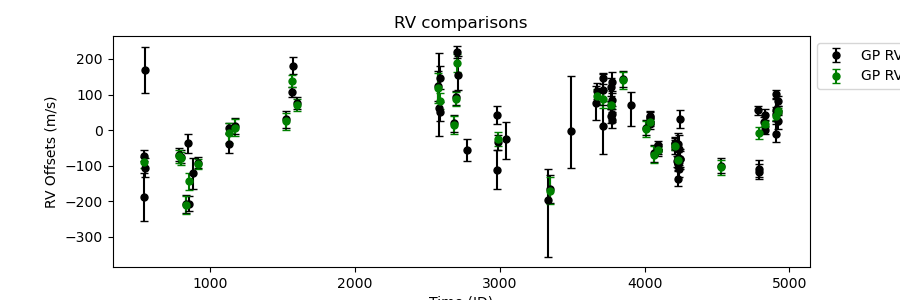

array([ -79.16527913,  -62.22084067,  -68.14581019, -200.11834818,
       -133.19934075,  -84.46200536,    3.18407016,   18.13530566,
         36.62903178,  149.45026408,   81.4577416 ,  130.3438253 ,
         92.03375647,   25.34738122,   98.85880239,  199.39613586,
        -12.72980451, -159.83264846,  105.77395193,   99.17618035,
         81.46051958,  150.73349225,   14.00065367,   34.60604598,
        -58.14533831,  -43.35720729,  -34.3034014 ,  -72.1761834 ,
        -92.89710803,    4.16030238,   29.37519766,   52.01408633,
         64.23441444])

In [53]:
rv_data_20 = pd.read_csv(par_dir + "/data/Posteriors_RV_TESS_20_0_All_ind.csv").ffill().set_index(['Photometry','Sector','RV group'])
rv_data = pd.read_csv(par_dir + "/data/Posteriors_RV.csv").ffill().set_index(['Photometry','Sector','RV group'])
plt.figure(figsize=(9,3))
rv_times_20 = rv_data_20.loc[("TESS_20_0","All")].index.values
rv_times = rv_data.loc[("TESS_20_0","All")].index.values
rv_GP_20 = rv_data_20.loc[("TESS_20_0","All"),("Offset","Inc - Offset","Inc + Offset")].values
rv_GP = rv_data.loc[("TESS_20_0","All"),("Offset","Inc - Offset","Inc + Offset")].values
plt.errorbar(rv_times_20, rv_GP_20[:,0] - np.nanmean(rv_GP_20[:,0]), yerr = rv_GP_20[:,1:3].T, fmt = 'ok', markersize = 5, capsize = 3, label = "GP RV indiv")
plt.errorbar(rv_times, rv_GP[:,0] - np.mean(rv_GP[:,0]), yerr = rv_GP[:,1:3].T, fmt = 'og', markersize = 5, capsize = 3, label = "GP RV groups")
plt.legend(bbox_to_anchor=(1.,1.),loc='upper left')
plt.xlabel("Time (JD)")
plt.ylabel("RV Offsets (m/s)")
plt.title("RV comparisons")
plt.show()


In [52]:
res.to_csv(par_dir + '/data/Posteriors_RV_TESS_20_0_All_ind.csv')
res

Likelihood     Log S0     Log Q    Log w0  \
Photometry Sector RV group                                                  
TESS_20_0  All    542.560166   -497.846507   2.036194  3.903751  5.754048   
                  544.552394    -23.554431 -11.732181 -1.624466  5.963093   
                  545.520343    -25.540698 -11.053284 -1.334306  5.981102   
                  546.536144   -424.315998   2.927842  3.176990  5.708156   
                  780.715065   -197.314808   1.328292  4.571992  5.671338   
...                                    ...        ...       ...       ...   
                  4908.546903  -500.902583   2.172853  4.871424  5.743012   
                  4909.548217  -293.375790   2.482326  3.393606  5.617769   
                  4921.581292 -1158.470952   2.744154  3.890066  5.768890   
                  4922.540740  -718.757924   3.117415  2.196211  5.600302   
                  4923.575618 -1270.912436   2.407053  3.114133  5.785997   

                                   Offset   Inc - S0   Inc + S0   Inc - Q  \
Photometry Sector RV group                                                  
TESS_20_0  All    542.560166   -64.863716   0.499175   0.527030  1.019291   
                  544.552394  -181.582738  12.441339  13.548206  5.906336   
                  545.520343   175.016580  12.892614  13.564867  6.062062   
                  546.536144   -98.395738   0.478157   0.529138  0.937921   
                  780.715065   -62.377935   1.081597   0.963958  1.399102   
...                                   ...        ...        ...       ...   
                  4908.546903   51.389303   0.487876   0.542542  1.055328   
                  4909.548217   64.425728   0.739649   0.874243  1.170069   
                  4921.581292   87.518736   0.250483   0.266293  0.827720   
                  4922.540740   31.493389   0.454859   0.549885  0.840055   
                  4923.575618   61.501955   0.280803   0.298064  0.597003   

                                Inc + Q  Inc - w0  Inc + w0  Inc - Offset  \
Photometry Sector RV group                                                  
TESS_20_0  All    542.560166   1.393770  0.030789  0.030073     16.357330   
                  544.552394   7.385826  0.662313  0.694198     68.101136   
                  545.520343   7.278304  0.670625  0.686407     64.280521   
                  546.536144   1.355383  0.044976  0.043606     26.379057   
                  780.715065   1.751830  0.032907  0.027897     18.332987   
...                                 ...       ...       ...           ...   
                  4908.546903  1.402907  0.017888  0.017371     19.147754   
                  4909.548217  1.494498  0.063451  0.054548     32.004617   
                  4921.581292  1.277153  0.019909  0.019137     14.147154   
                  4922.540740  1.231706  0.076349  0.069638     21.957626   
                  4923.575618  0.974278  0.018817  0.018542     12.126087   

                               Inc + Offset         RMS  
Photometry Sector RV group                               
TESS_20_0  All    542.560166      16.678346   62.695719  
                  544.552394      68.144855   64.262768  
                  545.520343      64.173117  137.776534  
                  546.536144      27.449724   53.664371  
                  780.715065      17.594375   39.849207  
...                                     ...         ...  
                  4908.546903     18.962605   62.471782  
                  4909.548217     29.722390   56.725743  
                  4921.581292     13.998886   50.730672  
                  4922.540740     22.405168   68.177650  
                  4923.575618     12.129339   63.346269  

[85 rows x 14 columns]

In [7]:
### DATA ###
photo_res = pd.read_csv(par_dir + "/data/Posteriors_photometries.csv").ffill().set_index(['Photometry','Sector'])

sectors_names = {"TESS_18_19" : ["All","Sector1","Sector2","Sector3"],
                "TESS_20_0" : ["All","Sector1","Sector2"],
                "TESS_20_1" : ["All","Sector1","Sector2"],
                "TESS_21" : ["All","Sector1","Sector2"]}

rv_time_plot_obs = np.array(["2685.70","2694.56","2707.08","2680-2710","4233.60","4226","4245"])

In [18]:
columns = ["Photometry","Sector","RV group","Likelihood","Log S0","Log Q","Log w0","Offset","Inc - S0","Inc + S0","Inc - Q","Inc + Q","Inc - w0","Inc + w0","Inc - Offset","Inc + Offset"]
rows = sectors_names.keys()
res_test = pd.DataFrame(columns=columns)

for key in sectors_names.keys() :
    for name in sectors_names[key] :
        for i in rv_time_plot_obs :
            df2 = pd.DataFrame([[key,name,i],[]],columns=['Photometry','Sector','RV group'])
            res_test = res_test.append(df2.loc[0])
res_test.set_index(["Photometry","Sector","RV group"],inplace=True)
res_test.sort_index(inplace=True)
res_test

Likelihood Log S0 Log Q Log w0 Offset Inc - S0  \
Photometry Sector  RV group                                                   
TESS_18_19 All     2680-2710        NaN    NaN   NaN    NaN    NaN      NaN   
                   2685.70          NaN    NaN   NaN    NaN    NaN      NaN   
                   2694.56          NaN    NaN   NaN    NaN    NaN      NaN   
                   2707.08          NaN    NaN   NaN    NaN    NaN      NaN   
                   4226             NaN    NaN   NaN    NaN    NaN      NaN   
...                                 ...    ...   ...    ...    ...      ...   
TESS_21    Sector2 2694.56          NaN    NaN   NaN    NaN    NaN      NaN   
                   2707.08          NaN    NaN   NaN    NaN    NaN      NaN   
                   4226             NaN    NaN   NaN    NaN    NaN      NaN   
                   4233.60          NaN    NaN   NaN    NaN    NaN      NaN   
                   4245             NaN    NaN   NaN    NaN    NaN      NaN   

                             Inc + S0 Inc - Q Inc + Q Inc - w0 Inc + w0  \
Photometry Sector  RV group                                               
TESS_18_19 All     2680-2710      NaN     NaN     NaN      NaN      NaN   
                   2685.70        NaN     NaN     NaN      NaN      NaN   
                   2694.56        NaN     NaN     NaN      NaN      NaN   
                   2707.08        NaN     NaN     NaN      NaN      NaN   
                   4226           NaN     NaN     NaN      NaN      NaN   
...                               ...     ...     ...      ...      ...   
TESS_21    Sector2 2694.56        NaN     NaN     NaN      NaN      NaN   
                   2707.08        NaN     NaN     NaN      NaN      NaN   
                   4226           NaN     NaN     NaN      NaN      NaN   
                   4233.60        NaN     NaN     NaN      NaN      NaN   
                   4245           NaN     NaN     NaN      NaN      NaN   

                             Inc - Offset Inc + Offset  
Photometry Sector  RV group                             
TESS_18_19 All     2680-2710          NaN          NaN  
                   2685.70            NaN          NaN  
                   2694.56            NaN          NaN  
                   2707.08            NaN          NaN  
                   4226               NaN          NaN  
...                                   ...          ...  
TESS_21    Sector2 2694.56            NaN          NaN  
                   2707.08            NaN          NaN  
                   4226               NaN          NaN  
                   4233.60            NaN          NaN  
                   4245               NaN          NaN  

[91 rows x 13 columns]

In [21]:
bnds = np.array([2685,2686,2694,2695,2706,2708,2685,2708,4226,4245,4226,4233,4233,4245])

for photometry in sectors_names.keys() :
    
    for name in sectors_names[photometry] :
        posteriors = photo_res.loc[(photometry,name),"Log S0":"Log w0"]
        
        for j in range(np.int(len(bnds)/2)) :
            print(photometry+"/"+name+"/"+rv_time_plot_obs[j]+"\n")
            rv_data = np.loadtxt(par_dir + "/data/rv_betapic_carine.txt",usecols=(0,1,2))
            rv_time = rv_data[:,0]
            rv_flux = rv_data[:,1]
            rv_error = rv_data[:,2]
            index = np.argwhere((rv_time>bnds[j*2])&(rv_time<bnds[(j*2)+1]))
            rv_flux = np.ndarray.flatten(rv_flux[index])*1000
            rv_time = np.sort(np.ndarray.flatten(rv_time[index]))
            rv_error = np.ndarray.flatten(rv_error[index])*1000
            
            
            gp = gp_building(posteriors,rv_time,rv_flux,rv_error)
            sampler,likelihood = run_mcmc(rv_time,rv_flux,gp)
            
            
            flat_samples = sampler.get_chain(discard = 500,thin=15, flat=True)
            labels = ["log(S0)","log(Q)","log(w0)","Offset"]

            rv_posteriors = np.array([])
            rv_posteriors_errors = np.array([])
#             corner.corner(flat_samples, labels=labels, truths=[None,posteriors[1],posteriors[2],None])
#             plt.title("Posteriors_MCMC_RV_%s_%s_%s"%(photometry,name,rv_time_plot_obs[j]))
#             plt.savefig(par_dir + "/plots/%s/%s/Posteriors_MCMC_RV_%s_%s_%s.pdf"%(photometry,name,photometry,name,rv_time_plot_obs[j]),bbox_inches='tight')
#             plt.close()  
        #     plt.show()

#             not_flat_samplers = sampler.get_chain(discard = 500, thin=15,flat=False)
#             fig,ax = plt.subplots(2,2)
#             for i in range(not_flat_samplers.shape[2]) :
#                 for cpt in range(2) :
#                     for cpt_1 in range(2) :
#                         if cpt == 0 :
#                             ax[cpt,cpt_1].plot(not_flat_samplers[:,i,(cpt)+(cpt_1)],linewidth=0.5)
#                             ax[cpt,cpt_1].set_title(labels[(cpt)+(cpt_1)])
#                         if cpt == 1 :
#                             ax[cpt,cpt_1].plot(not_flat_samplers[:,i,(cpt)+(cpt_1+1)],linewidth=0.5)
#                             ax[cpt,cpt_1].set_title(labels[(cpt)+(cpt_1+1)])

#             plt.savefig(par_dir + "/plots/%s/%s/Samplers_MCMC_RV_%s_%s_%s.pdf"%(photometry,name,photometry,name,rv_time_plot_obs[j]),bbox_inches='tight')
#             plt.close() 
        #     plt.show()
        
#             x = np.linspace(np.min(rv_time),np.max(rv_time),15000)
#             pred_mean, pred_var = gp.predict(rv_flux, x, return_var=True)
#             pred_std = np.sqrt(pred_var)

#             color = "#ff7f0e"
#             plt.figure()
#             plt.scatter(rv_time,rv_flux,s=1)
#             plt.plot(x, pred_mean, color=color)
#             plt.fill_between(x, pred_mean+pred_std, pred_mean-pred_std, color=color, alpha=0.3, edgecolor="none",interpolate=True)
#             plt.xlabel("x")
#             plt.ylabel("y")
#             plt.ylim(np.min(rv_flux),np.max(rv_flux))
#             plt.title("Fit_MCMC_RV_%s_%s_%s"%(photometry,name,rv_time_plot_obs[j]))
#             plt.savefig(par_dir + "/plots/%s/%s/Fit_MCMC_RV_%s_%s_%s.pdf"%(photometry,name,photometry,name,rv_time_plot_obs[j]),bbox_inches='tight')
#             plt.close() 
        #     plt.show()

            for i in range(flat_samples.shape[1]):

                mcmc = np.percentile(flat_samples[:, i], [16, 50, 84])
                value = np.percentile(flat_samples[:, i], [50])
                q = np.diff(mcmc)
                txt = "\mathrm{{{3}}} = {0:.3f}_{{-{1:.3f}}}^{{{2:.3f}}}"
                txt = txt.format(mcmc[1], q[0], q[1], labels[i])
                display(Math(txt))
                rv_posteriors = np.append(rv_posteriors,value)
                rv_posteriors_errors = np.append(rv_posteriors_errors,q)
                
            res_test.loc[(photometry,name,rv_time_plot_obs[j]),['Likelihood']] = likelihood    
            res_test.loc[(photometry,name,rv_time_plot_obs[j]),"Log S0":"Offset"] = rv_posteriors
            res_test.loc[(photometry,name,rv_time_plot_obs[j]),"Inc - S0" : "Inc + Offset"] = rv_posteriors_errors



  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_18_19/All/2685.70

Initial log likelihood: -1108.5971775361438
parameter_dict:
OrderedDict([('kernel:log_S0', -21.05867712761681), ('kernel:log_Q', 2.153635181524829), ('kernel:log_omega0', 5.764505266388031), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [05:30<00:00, 45.33it/s]

Finished
Mean acceptance fraction: 0.585553125
parameter_dict:
OrderedDict([('kernel:log_S0', 2.562328216731451), ('kernel:log_Q', 4.333550571744788), ('kernel:log_omega0', 5.687035377664828), ('mean:value', 0.6359416247229213)])

Final MCMC log likelihood: -258.5989673670679


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

TESS_18_19/All/2694.56

Initial log likelihood: -553.06243188476
parameter_dict:
OrderedDict([('kernel:log_S0', -21.05867712761681), ('kernel:log_Q', 2.153635181524829), ('kernel:log_omega0', 5.764505266388031), ('mean:value', 0.0)])

Running burn-in...


100%|██████████| 1500/1500 [00:29<00:00, 50.02it/s]


Running production...


100%|██████████| 15000/15000 [05:21<00:00, 46.68it/s]

Finished
Mean acceptance fraction: 0.5795203124999999
parameter_dict:
OrderedDict([('kernel:log_S0', 1.331477112715996), ('kernel:log_Q', 7.064162994735865), ('kernel:log_omega0', 5.763253075472934), ('mean:value', 100.22487000195416)])

Final MCMC log likelihood: -236.2076400361994


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

TESS_18_19/All/2707.08

Initial log likelihood: -1184.8418613821893
parameter_dict:
OrderedDict([('kernel:log_S0', -21.05867712761681), ('kernel:log_Q', 2.153635181524829), ('kernel:log_omega0', 5.764505266388031), ('mean:value', 0.0)])

Running burn-in...


100%|██████████| 1500/1500 [00:32<00:00, 46.42it/s]


Running production...


100%|██████████| 15000/15000 [05:27<00:00, 45.82it/s]

Finished
Mean acceptance fraction: 0.5874177083333334
parameter_dict:
OrderedDict([('kernel:log_S0', 3.1020568208937953), ('kernel:log_Q', 2.429928723738466), ('kernel:log_omega0', 5.647900526294077), ('mean:value', 187.66238596901792)])

Final MCMC log likelihood: -602.228374105365


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_18_19/All/2680-2710

Initial log likelihood: -2846.5014708030926
parameter_dict:
OrderedDict([('kernel:log_S0', -21.05867712761681), ('kernel:log_Q', 2.153635181524829), ('kernel:log_omega0', 5.764505266388031), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/15000 [00:00<05:59, 41.66it/s]

Running production...


100%|██████████| 15000/15000 [05:53<00:00, 42.40it/s]

Finished
Mean acceptance fraction: 0.5899411458333333
parameter_dict:
OrderedDict([('kernel:log_S0', 3.520039931848348), ('kernel:log_Q', 2.1989806633115636), ('kernel:log_omega0', 5.635718408435005), ('mean:value', 121.99806115965734)])

Final MCMC log likelihood: -1112.2179163344456


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_18_19/All/4233.60

Initial log likelihood: -15478.642892308244
parameter_dict:
OrderedDict([('kernel:log_S0', -21.05867712761681), ('kernel:log_Q', 2.153635181524829), ('kernel:log_omega0', 5.764505266388031), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [10:24<00:00, 24.03it/s]

Finished
Mean acceptance fraction: 0.5831041666666666
parameter_dict:
OrderedDict([('kernel:log_S0', 2.9759118622472105), ('kernel:log_Q', 2.644510979381821), ('kernel:log_omega0', 5.728838800656445), ('mean:value', -70.26432310482423)])

Final MCMC log likelihood: -4650.464959453863


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_18_19/All/4226

Initial log likelihood: -10493.87492261579
parameter_dict:
OrderedDict([('kernel:log_S0', -21.05867712761681), ('kernel:log_Q', 2.153635181524829), ('kernel:log_omega0', 5.764505266388031), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 3/15000 [00:00<08:24, 29.70it/s]

Running production...


100%|██████████| 15000/15000 [08:14<00:00, 30.33it/s]

Finished
Mean acceptance fraction: 0.5840171875
parameter_dict:
OrderedDict([('kernel:log_S0', 2.7850520869909894), ('kernel:log_Q', 3.1900205111089184), ('kernel:log_omega0', 5.723780717402559), ('mean:value', -85.92901894349245)])

Final MCMC log likelihood: -2965.581969942649


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_18_19/All/4245

Initial log likelihood: -4984.767969692443
parameter_dict:
OrderedDict([('kernel:log_S0', -21.05867712761681), ('kernel:log_Q', 2.153635181524829), ('kernel:log_omega0', 5.764505266388031), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 4/15000 [00:00<06:59, 35.71it/s]

Running production...


100%|██████████| 15000/15000 [06:41<00:00, 37.32it/s]

Finished
Mean acceptance fraction: 0.5914109375000001
parameter_dict:
OrderedDict([('kernel:log_S0', 3.2112098823533035), ('kernel:log_Q', 2.250266891804895), ('kernel:log_omega0', 5.7368120825765665), ('mean:value', -40.76246176900444)])

Final MCMC log likelihood: -1678.7447495625552


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_18_19/Sector1/2685.70

Initial log likelihood: -1108.5971768518828
parameter_dict:
OrderedDict([('kernel:log_S0', -21.74943471810689), ('kernel:log_Q', 2.879152611319988), ('kernel:log_omega0', 5.757251560472405), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/15000 [00:00<04:54, 50.84it/s]

Running production...


100%|██████████| 15000/15000 [04:43<00:00, 52.86it/s]

Finished
Mean acceptance fraction: 0.5849947916666667
parameter_dict:
OrderedDict([('kernel:log_S0', 2.638397326603857), ('kernel:log_Q', 4.745202139975156), ('kernel:log_omega0', 5.721005797019875), ('mean:value', 14.896561007431226)])

Final MCMC log likelihood: -257.895409659533


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_18_19/Sector1/2694.56

Initial log likelihood: -553.0624315631641
parameter_dict:
OrderedDict([('kernel:log_S0', -21.74943471810689), ('kernel:log_Q', 2.879152611319988), ('kernel:log_omega0', 5.757251560472405), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/15000 [00:00<05:08, 48.54it/s]

Running production...


100%|██████████| 15000/15000 [04:43<00:00, 52.91it/s]

Finished
Mean acceptance fraction: 0.5794869791666666
parameter_dict:
OrderedDict([('kernel:log_S0', 1.5030363070558008), ('kernel:log_Q', 3.5058438255397375), ('kernel:log_omega0', 5.7706128521824045), ('mean:value', 95.8653784651165)])

Final MCMC log likelihood: -234.18844229364973


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_18_19/Sector1/2707.08

Initial log likelihood: -1184.8418614075674
parameter_dict:
OrderedDict([('kernel:log_S0', -21.74943471810689), ('kernel:log_Q', 2.879152611319988), ('kernel:log_omega0', 5.757251560472405), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/15000 [00:00<05:26, 45.87it/s]

Running production...


100%|██████████| 15000/15000 [05:15<00:00, 47.61it/s]

Finished
Mean acceptance fraction: 0.5880546874999999
parameter_dict:
OrderedDict([('kernel:log_S0', 2.9126732402547124), ('kernel:log_Q', 2.3484369960568983), ('kernel:log_omega0', 5.691017505086736), ('mean:value', 222.6661673518304)])

Final MCMC log likelihood: -604.162472500136


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

TESS_18_19/Sector1/2680-2710

Initial log likelihood: -2846.5014698226128
parameter_dict:
OrderedDict([('kernel:log_S0', -21.74943471810689), ('kernel:log_Q', 2.879152611319988), ('kernel:log_omega0', 5.757251560472405), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/15000 [00:00<05:59, 41.66it/s]

Running production...


100%|██████████| 15000/15000 [05:53<00:00, 42.39it/s]

Finished
Mean acceptance fraction: 0.5898395833333334
parameter_dict:
OrderedDict([('kernel:log_S0', 3.6480551811712747), ('kernel:log_Q', 2.4588566932752696), ('kernel:log_omega0', 5.647942298488276), ('mean:value', 131.88885033738634)])

Final MCMC log likelihood: -1110.8209699100553


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_18_19/Sector1/4233.60

Initial log likelihood: -15478.642874947633
parameter_dict:
OrderedDict([('kernel:log_S0', -21.74943471810689), ('kernel:log_Q', 2.879152611319988), ('kernel:log_omega0', 5.757251560472405), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [10:28<00:00, 23.88it/s]

Finished
Mean acceptance fraction: 0.5924197916666667
parameter_dict:
OrderedDict([('kernel:log_S0', 3.088173333315876), ('kernel:log_Q', 2.511169385358906), ('kernel:log_omega0', 5.6835031121539235), ('mean:value', -63.02156916230227)])

Final MCMC log likelihood: -4654.771198463777


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

TESS_18_19/Sector1/4226

Initial log likelihood: -10493.87490927446
parameter_dict:
OrderedDict([('kernel:log_S0', -21.74943471810689), ('kernel:log_Q', 2.879152611319988), ('kernel:log_omega0', 5.757251560472405), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 3/15000 [00:00<08:29, 29.41it/s]

Running production...


100%|██████████| 15000/15000 [08:46<00:00, 28.50it/s]

Finished
Mean acceptance fraction: 0.5826098958333334
parameter_dict:
OrderedDict([('kernel:log_S0', 2.0875278825069215), ('kernel:log_Q', 4.544628355269336), ('kernel:log_omega0', 5.7006598872275225), ('mean:value', -90.34498319732062)])

Final MCMC log likelihood: -2973.6515456623088


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_18_19/Sector1/4245

Initial log likelihood: -4984.7679656731625
parameter_dict:
OrderedDict([('kernel:log_S0', -21.74943471810689), ('kernel:log_Q', 2.879152611319988), ('kernel:log_omega0', 5.757251560472405), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [06:59<00:00, 35.73it/s]


Finished
Mean acceptance fraction: 0.591209375
parameter_dict:
OrderedDict([('kernel:log_S0', 3.186987028986003), ('kernel:log_Q', 2.2296212271095355), ('kernel:log_omega0', 5.7343848967569775), ('mean:value', -39.140563527693494)])

Final MCMC log likelihood: -1678.7843013067654


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_18_19/Sector2/2685.70

Initial log likelihood: -1108.5971777573075
parameter_dict:
OrderedDict([('kernel:log_S0', -20.881503559846912), ('kernel:log_Q', 1.963501515068954), ('kernel:log_omega0', 5.766532749680148), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 2/15000 [00:00<14:37, 17.09it/s]

Running production...


100%|██████████| 15000/15000 [04:59<00:00, 50.12it/s]


Finished
Mean acceptance fraction: 0.5856020833333333
parameter_dict:
OrderedDict([('kernel:log_S0', 3.8569775879121604), ('kernel:log_Q', 5.284891524714574), ('kernel:log_omega0', 5.6700624870847935), ('mean:value', 21.805867080637675)])

Final MCMC log likelihood: -262.91323951090976


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_18_19/Sector2/2694.56

Initial log likelihood: -553.0624319938324
parameter_dict:
OrderedDict([('kernel:log_S0', -20.881503559846912), ('kernel:log_Q', 1.963501515068954), ('kernel:log_omega0', 5.766532749680148), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [04:57<00:00, 50.47it/s]


Finished
Mean acceptance fraction: 0.5798557291666666
parameter_dict:
OrderedDict([('kernel:log_S0', 1.6943710889750638), ('kernel:log_Q', 3.1968982408153903), ('kernel:log_omega0', 5.746081429001292), ('mean:value', 111.54387918250794)])

Final MCMC log likelihood: -235.24317243522324


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

TESS_18_19/Sector2/2707.08

Initial log likelihood: -1184.8418613764811
parameter_dict:
OrderedDict([('kernel:log_S0', -20.881503559846912), ('kernel:log_Q', 1.963501515068954), ('kernel:log_omega0', 5.766532749680148), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [05:26<00:00, 45.88it/s]

Finished
Mean acceptance fraction: 0.5874390625000001
parameter_dict:
OrderedDict([('kernel:log_S0', 4.484062537121339), ('kernel:log_Q', 1.9140255828993844), ('kernel:log_omega0', 5.65946479112279), ('mean:value', 112.5058324898038)])

Final MCMC log likelihood: -610.6823068069266


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_18_19/Sector2/2680-2710

Initial log likelihood: -2846.501471127623
parameter_dict:
OrderedDict([('kernel:log_S0', -20.881503559846912), ('kernel:log_Q', 1.963501515068954), ('kernel:log_omega0', 5.766532749680148), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 2/15000 [00:00<13:52, 18.02it/s]

Running production...


100%|██████████| 15000/15000 [06:05<00:00, 41.09it/s]

Finished
Mean acceptance fraction: 0.5911734375
parameter_dict:
OrderedDict([('kernel:log_S0', 3.6690779357529673), ('kernel:log_Q', 2.5664665403023053), ('kernel:log_omega0', 5.663869321139055), ('mean:value', 126.59413062245065)])

Final MCMC log likelihood: -1110.3326421496702


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_18_19/Sector2/4233.60

Initial log likelihood: -15478.64289765507
parameter_dict:
OrderedDict([('kernel:log_S0', -20.881503559846912), ('kernel:log_Q', 1.963501515068954), ('kernel:log_omega0', 5.766532749680148), ('mean:value', 0.0)])

Running burn-in...


100%|██████████| 1500/1500 [01:01<00:00, 24.29it/s]


Running production...


100%|██████████| 15000/15000 [10:45<00:00, 23.25it/s]

Finished
Mean acceptance fraction: 0.5879916666666667
parameter_dict:
OrderedDict([('kernel:log_S0', 2.8916308553547734), ('kernel:log_Q', 3.1549905250334898), ('kernel:log_omega0', 5.694446748560352), ('mean:value', -70.6550180499394)])

Final MCMC log likelihood: -4652.14156656542


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_18_19/Sector2/4226

Initial log likelihood: -10493.874926563387
parameter_dict:
OrderedDict([('kernel:log_S0', -20.881503559846912), ('kernel:log_Q', 1.963501515068954), ('kernel:log_omega0', 5.766532749680148), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [08:26<00:00, 29.64it/s]

Finished
Mean acceptance fraction: 0.5911520833333334
parameter_dict:
OrderedDict([('kernel:log_S0', 2.656038612995841), ('kernel:log_Q', 3.4766554710596584), ('kernel:log_omega0', 5.707647001259632), ('mean:value', -85.89661808150666)])

Final MCMC log likelihood: -2964.92807933489


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_18_19/Sector2/4245

Initial log likelihood: -4984.7679710916855
parameter_dict:
OrderedDict([('kernel:log_S0', -20.881503559846912), ('kernel:log_Q', 1.963501515068954), ('kernel:log_omega0', 5.766532749680148), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [06:41<00:00, 37.39it/s]

Finished
Mean acceptance fraction: 0.5915354166666666
parameter_dict:
OrderedDict([('kernel:log_S0', 3.082148837732394), ('kernel:log_Q', 2.1083771529017987), ('kernel:log_omega0', 5.665085487519571), ('mean:value', -0.7569140907463421)])

Final MCMC log likelihood: -1691.513968437352


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_18_19/Sector3/2685.70

Initial log likelihood: -1108.5971780937343
parameter_dict:
OrderedDict([('kernel:log_S0', -20.61996223992065), ('kernel:log_Q', 1.6885837125168943), ('kernel:log_omega0', 5.774013539411806), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [04:43<00:00, 52.89it/s]

Finished
Mean acceptance fraction: 0.5856145833333333
parameter_dict:
OrderedDict([('kernel:log_S0', 1.6239361738894424), ('kernel:log_Q', 6.431638553026013), ('kernel:log_omega0', 5.73135874369079), ('mean:value', -21.30786882218667)])

Final MCMC log likelihood: -262.3572635626992


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_18_19/Sector3/2694.56

Initial log likelihood: -553.0624321456075
parameter_dict:
OrderedDict([('kernel:log_S0', -20.61996223992065), ('kernel:log_Q', 1.6885837125168943), ('kernel:log_omega0', 5.774013539411806), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/15000 [00:00<04:57, 50.42it/s]

Running production...


100%|██████████| 15000/15000 [04:42<00:00, 53.07it/s]

Finished
Mean acceptance fraction: 0.5802729166666666
parameter_dict:
OrderedDict([('kernel:log_S0', 1.5005252161108564), ('kernel:log_Q', 5.373455867748445), ('kernel:log_omega0', 5.758212463546598), ('mean:value', 87.49681309953654)])

Final MCMC log likelihood: -235.05895510243366


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

TESS_18_19/Sector3/2707.08

Initial log likelihood: -1184.841861370015
parameter_dict:
OrderedDict([('kernel:log_S0', -20.61996223992065), ('kernel:log_Q', 1.6885837125168943), ('kernel:log_omega0', 5.774013539411806), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/15000 [00:00<05:29, 45.45it/s]

Running production...


100%|██████████| 15000/15000 [05:13<00:00, 47.77it/s]

Finished
Mean acceptance fraction: 0.5873161458333332
parameter_dict:
OrderedDict([('kernel:log_S0', 3.0048879221809415), ('kernel:log_Q', 2.3719604866101403), ('kernel:log_omega0', 5.580910704118358), ('mean:value', 198.98872936758463)])

Final MCMC log likelihood: -602.3792940619552


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_18_19/Sector3/2680-2710

Initial log likelihood: -2846.501471609355
parameter_dict:
OrderedDict([('kernel:log_S0', -20.61996223992065), ('kernel:log_Q', 1.6885837125168943), ('kernel:log_omega0', 5.774013539411806), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 4/15000 [00:00<06:14, 40.00it/s]

Running production...


100%|██████████| 15000/15000 [05:51<00:00, 42.63it/s]

Finished
Mean acceptance fraction: 0.5911791666666667
parameter_dict:
OrderedDict([('kernel:log_S0', 3.494490851643192), ('kernel:log_Q', 2.3931514944909047), ('kernel:log_omega0', 5.675012883930266), ('mean:value', 134.29934595743282)])

Final MCMC log likelihood: -1109.8203380424432


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_18_19/Sector3/4233.60

Initial log likelihood: -15478.64290584527
parameter_dict:
OrderedDict([('kernel:log_S0', -20.61996223992065), ('kernel:log_Q', 1.6885837125168943), ('kernel:log_omega0', 5.774013539411806), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [10:24<00:00, 24.02it/s]

Finished
Mean acceptance fraction: 0.5822322916666667
parameter_dict:
OrderedDict([('kernel:log_S0', 3.134762975128695), ('kernel:log_Q', 3.0556841569673567), ('kernel:log_omega0', 5.717134604951353), ('mean:value', -73.69428437294177)])

Final MCMC log likelihood: -4652.112541561578


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_18_19/Sector3/4226

Initial log likelihood: -10493.874932673914
parameter_dict:
OrderedDict([('kernel:log_S0', -20.61996223992065), ('kernel:log_Q', 1.6885837125168943), ('kernel:log_omega0', 5.774013539411806), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [08:44<00:00, 28.59it/s]

Finished
Mean acceptance fraction: 0.5910359375
parameter_dict:
OrderedDict([('kernel:log_S0', 2.4216479830385502), ('kernel:log_Q', 3.509618354399139), ('kernel:log_omega0', 5.704877839635652), ('mean:value', -89.7311169113704)])

Final MCMC log likelihood: -2966.029107770901


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

TESS_18_19/Sector3/4245

Initial log likelihood: -4984.7679731713515
parameter_dict:
OrderedDict([('kernel:log_S0', -20.61996223992065), ('kernel:log_Q', 1.6885837125168943), ('kernel:log_omega0', 5.774013539411806), ('mean:value', 0.0)])

Running burn-in...


100%|██████████| 1500/1500 [00:43<00:00, 34.62it/s]


Running production...


100%|██████████| 15000/15000 [07:58<00:00, 31.32it/s]

Finished
Mean acceptance fraction: 0.591496875
parameter_dict:
OrderedDict([('kernel:log_S0', 3.18538545230417), ('kernel:log_Q', 1.9312029751155104), ('kernel:log_omega0', 5.729377438178358), ('mean:value', -51.88953876294891)])

Final MCMC log likelihood: -1679.271569159394


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/2685.70

Initial log likelihood: -314.2441381080109
parameter_dict:
OrderedDict([('kernel:log_S0', 8.858849772627723), ('kernel:log_Q', 2.9868736843717585), ('kernel:log_omega0', 5.743940077027047), ('mean:value', 0.0)])

Running burn-in...


100%|██████████| 1500/1500 [00:39<00:00, 38.38it/s]


Running production...


100%|██████████| 15000/15000 [05:36<00:00, 44.59it/s]

Finished
Mean acceptance fraction: 0.5848645833333332
parameter_dict:
OrderedDict([('kernel:log_S0', 1.8521545808942763), ('kernel:log_Q', 5.080915684596054), ('kernel:log_omega0', 5.720830052011415), ('mean:value', 25.890830130102266)])

Final MCMC log likelihood: -257.593524005263


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/2694.56

Initial log likelihood: -291.45391590414215
parameter_dict:
OrderedDict([('kernel:log_S0', 8.858849772627723), ('kernel:log_Q', 2.9868736843717585), ('kernel:log_omega0', 5.743940077027047), ('mean:value', 0.0)])

Running burn-in...


100%|██████████| 1500/1500 [00:31<00:00, 47.12it/s]


Running production...


100%|██████████| 15000/15000 [05:32<00:00, 45.10it/s]

Finished
Mean acceptance fraction: 0.5795635416666667
parameter_dict:
OrderedDict([('kernel:log_S0', 3.150616381668784), ('kernel:log_Q', 4.40896355189674), ('kernel:log_omega0', 5.728775743866171), ('mean:value', 48.388186141628665)])

Final MCMC log likelihood: -238.9000841645357


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/2707.08

Initial log likelihood: -706.2556677846679
parameter_dict:
OrderedDict([('kernel:log_S0', 8.858849772627723), ('kernel:log_Q', 2.9868736843717585), ('kernel:log_omega0', 5.743940077027047), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [06:18<00:00, 39.66it/s]

Finished
Mean acceptance fraction: 0.5870666666666666
parameter_dict:
OrderedDict([('kernel:log_S0', 2.6170198371026263), ('kernel:log_Q', 2.4240975773508193), ('kernel:log_omega0', 5.799371366708242), ('mean:value', 196.07397277278807)])

Final MCMC log likelihood: -610.5923886377228


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/All/2680-2710

Initial log likelihood: -1311.9537217968198
parameter_dict:
OrderedDict([('kernel:log_S0', 8.858849772627723), ('kernel:log_Q', 2.9868736843717585), ('kernel:log_omega0', 5.743940077027047), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [06:47<00:00, 36.85it/s]

Finished
Mean acceptance fraction: 0.591221875
parameter_dict:
OrderedDict([('kernel:log_S0', 3.4837720333057045), ('kernel:log_Q', 3.5649122407807736), ('kernel:log_omega0', 5.658544734012685), ('mean:value', 124.94483694226462)])

Final MCMC log likelihood: -1112.033490571344


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

TESS_20_0/All/4233.60

Initial log likelihood: -5439.200397955288
parameter_dict:
OrderedDict([('kernel:log_S0', 8.858849772627723), ('kernel:log_Q', 2.9868736843717585), ('kernel:log_omega0', 5.743940077027047), ('mean:value', 0.0)])

Running burn-in...


100%|██████████| 1500/1500 [01:12<00:00, 20.77it/s]


Running production...


100%|██████████| 15000/15000 [12:29<00:00, 20.02it/s]

Finished
Mean acceptance fraction: 0.5920999999999998
parameter_dict:
OrderedDict([('kernel:log_S0', 3.2210658151573623), ('kernel:log_Q', 2.6204423269905), ('kernel:log_omega0', 5.7214096932242455), ('mean:value', -89.84733803046458)])

Final MCMC log likelihood: -4654.412005049187


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

TESS_20_0/All/4226

Initial log likelihood: -3465.145006607074
parameter_dict:
OrderedDict([('kernel:log_S0', 8.858849772627723), ('kernel:log_Q', 2.9868736843717585), ('kernel:log_omega0', 5.743940077027047), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [10:06<00:00, 24.75it/s]

Finished
Mean acceptance fraction: 0.5919697916666666
parameter_dict:
OrderedDict([('kernel:log_S0', 2.564383022476971), ('kernel:log_Q', 2.999883626981989), ('kernel:log_omega0', 5.719120590684102), ('mean:value', -78.93475121283294)])

Final MCMC log likelihood: -2966.010430837175


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

TESS_20_0/All/4245

Initial log likelihood: -1974.0553913482145
parameter_dict:
OrderedDict([('kernel:log_S0', 8.858849772627723), ('kernel:log_Q', 2.9868736843717585), ('kernel:log_omega0', 5.743940077027047), ('mean:value', 0.0)])

Running burn-in...


100%|██████████| 1500/1500 [00:47<00:00, 31.75it/s]


Running production...


100%|██████████| 15000/15000 [07:14<00:00, 34.56it/s]

Finished
Mean acceptance fraction: 0.5915760416666667
parameter_dict:
OrderedDict([('kernel:log_S0', 3.2300322450797165), ('kernel:log_Q', 0.6465259064852495), ('kernel:log_omega0', 5.784570499476503), ('mean:value', -32.5500603129937)])

Final MCMC log likelihood: -1722.4299475709067


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/Sector1/2685.70

Initial log likelihood: -314.9673856790754
parameter_dict:
OrderedDict([('kernel:log_S0', 8.898938913406607), ('kernel:log_Q', 2.9633317647014703), ('kernel:log_omega0', 5.745130346758717), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 2/15000 [00:00<13:44, 18.18it/s]

Running production...


100%|██████████| 15000/15000 [05:04<00:00, 49.25it/s]

Finished
Mean acceptance fraction: 0.5851390625
parameter_dict:
OrderedDict([('kernel:log_S0', 1.5284265226580809), ('kernel:log_Q', 8.025786107708102), ('kernel:log_omega0', 5.7383647606883175), ('mean:value', 24.895366957098112)])

Final MCMC log likelihood: -261.76599147518806


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/Sector1/2694.56

Initial log likelihood: -292.15638170464825
parameter_dict:
OrderedDict([('kernel:log_S0', 8.898938913406607), ('kernel:log_Q', 2.9633317647014703), ('kernel:log_omega0', 5.745130346758717), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [05:04<00:00, 49.29it/s]

Finished
Mean acceptance fraction: 0.5795
parameter_dict:
OrderedDict([('kernel:log_S0', 1.0252678343810162), ('kernel:log_Q', 6.427643628142264), ('kernel:log_omega0', 5.773141047230571), ('mean:value', 98.38680943412832)])

Final MCMC log likelihood: -235.3563716661693


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/Sector1/2707.08

Initial log likelihood: -707.6648245205988
parameter_dict:
OrderedDict([('kernel:log_S0', 8.898938913406607), ('kernel:log_Q', 2.9633317647014703), ('kernel:log_omega0', 5.745130346758717), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [05:23<00:00, 46.42it/s]


Finished
Mean acceptance fraction: 0.5873614583333333
parameter_dict:
OrderedDict([('kernel:log_S0', 3.2048694690391564), ('kernel:log_Q', 2.3518415358830964), ('kernel:log_omega0', 5.525494870638676), ('mean:value', 207.4678440182138)])

Final MCMC log likelihood: -603.5745231601137


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/Sector1/2680-2710

Initial log likelihood: -1314.7885919043222
parameter_dict:
OrderedDict([('kernel:log_S0', 8.898938913406607), ('kernel:log_Q', 2.9633317647014703), ('kernel:log_omega0', 5.745130346758717), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [05:56<00:00, 42.09it/s]

Finished
Mean acceptance fraction: 0.5904911458333333
parameter_dict:
OrderedDict([('kernel:log_S0', 3.070610353012466), ('kernel:log_Q', 2.831376622385214), ('kernel:log_omega0', 5.765426207773899), ('mean:value', 134.79688327588232)])

Final MCMC log likelihood: -1114.7566748595063


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/Sector1/4233.60

Initial log likelihood: -5450.632814700604
parameter_dict:
OrderedDict([('kernel:log_S0', 8.898938913406607), ('kernel:log_Q', 2.9633317647014703), ('kernel:log_omega0', 5.745130346758717), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [10:44<00:00, 23.28it/s]

Finished
Mean acceptance fraction: 0.5926130208333333
parameter_dict:
OrderedDict([('kernel:log_S0', 3.064877656171196), ('kernel:log_Q', 2.627520357221223), ('kernel:log_omega0', 5.711439310052114), ('mean:value', -88.78356410485858)])

Final MCMC log likelihood: -4652.229148141544


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/Sector1/4226

Initial log likelihood: -3472.2611756643405
parameter_dict:
OrderedDict([('kernel:log_S0', 8.898938913406607), ('kernel:log_Q', 2.9633317647014703), ('kernel:log_omega0', 5.745130346758717), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 3/15000 [00:00<08:49, 28.30it/s]

Running production...


100%|██████████| 15000/15000 [08:24<00:00, 29.74it/s]

Finished
Mean acceptance fraction: 0.5915729166666667
parameter_dict:
OrderedDict([('kernel:log_S0', 2.769484497816705), ('kernel:log_Q', 3.460729656583017), ('kernel:log_omega0', 5.711134945987376), ('mean:value', -92.07910794775651)])

Final MCMC log likelihood: -2965.439025715373


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/Sector1/4245

Initial log likelihood: -1978.3716390362692
parameter_dict:
OrderedDict([('kernel:log_S0', 8.898938913406607), ('kernel:log_Q', 2.9633317647014703), ('kernel:log_omega0', 5.745130346758717), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 4/15000 [00:00<06:41, 37.38it/s]

Running production...


100%|██████████| 15000/15000 [06:45<00:00, 36.96it/s]

Finished
Mean acceptance fraction: 0.5914135416666667
parameter_dict:
OrderedDict([('kernel:log_S0', 3.167167340401677), ('kernel:log_Q', 2.165876270247941), ('kernel:log_omega0', 5.71280785436221), ('mean:value', -44.27517326697549)])

Final MCMC log likelihood: -1678.9014127370738


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/Sector2/2685.70

Initial log likelihood: -313.60419638368876
parameter_dict:
OrderedDict([('kernel:log_S0', 8.823191479481865), ('kernel:log_Q', 3.009962867150601), ('kernel:log_omega0', 5.742817389364436), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/15000 [00:00<04:49, 51.72it/s]

Running production...


100%|██████████| 15000/15000 [04:46<00:00, 52.36it/s]

Finished
Mean acceptance fraction: 0.5858770833333333
parameter_dict:
OrderedDict([('kernel:log_S0', 2.1991022634002335), ('kernel:log_Q', 4.712778096450863), ('kernel:log_omega0', 5.719053052933963), ('mean:value', 3.0273130753037076)])

Final MCMC log likelihood: -257.7904340737488


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/Sector2/2694.56

Initial log likelihood: -290.83204026393855
parameter_dict:
OrderedDict([('kernel:log_S0', 8.823191479481865), ('kernel:log_Q', 3.009962867150601), ('kernel:log_omega0', 5.742817389364436), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [04:44<00:00, 52.69it/s]

Finished
Mean acceptance fraction: 0.5799994791666666
parameter_dict:
OrderedDict([('kernel:log_S0', 1.2517919556229828), ('kernel:log_Q', 4.007048170305833), ('kernel:log_omega0', 5.769219009816883), ('mean:value', 101.63717172909338)])

Final MCMC log likelihood: -234.17308598417355


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/Sector2/2707.08

Initial log likelihood: -705.0113574745809
parameter_dict:
OrderedDict([('kernel:log_S0', 8.823191479481865), ('kernel:log_Q', 3.009962867150601), ('kernel:log_omega0', 5.742817389364436), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/15000 [00:00<05:35, 44.64it/s]

Running production...


100%|██████████| 15000/15000 [05:14<00:00, 47.70it/s]

Finished
Mean acceptance fraction: 0.5871776041666668
parameter_dict:
OrderedDict([('kernel:log_S0', 3.3931885890896316), ('kernel:log_Q', 1.6432247273084253), ('kernel:log_omega0', 5.5965233115623665), ('mean:value', 190.931100896843)])

Final MCMC log likelihood: -602.8094478003197


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/Sector2/2680-2710

Initial log likelihood: -1309.447594122208
parameter_dict:
OrderedDict([('kernel:log_S0', 8.823191479481865), ('kernel:log_Q', 3.009962867150601), ('kernel:log_omega0', 5.742817389364436), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [05:53<00:00, 42.42it/s]

Finished
Mean acceptance fraction: 0.5914677083333334
parameter_dict:
OrderedDict([('kernel:log_S0', 3.795095321758411), ('kernel:log_Q', 1.4961760787276062), ('kernel:log_omega0', 5.737077723132686), ('mean:value', 89.67132258178268)])

Final MCMC log likelihood: -1116.6332125553056


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/Sector2/4233.60

Initial log likelihood: -5429.103557744704
parameter_dict:
OrderedDict([('kernel:log_S0', 8.823191479481865), ('kernel:log_Q', 3.009962867150601), ('kernel:log_omega0', 5.742817389364436), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [10:34<00:00, 23.64it/s]

Finished
Mean acceptance fraction: 0.592496875
parameter_dict:
OrderedDict([('kernel:log_S0', 3.070325343302913), ('kernel:log_Q', 2.766451246901456), ('kernel:log_omega0', 5.707409179086737), ('mean:value', -68.40719059172335)])

Final MCMC log likelihood: -4650.12282198379


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/Sector2/4226

Initial log likelihood: -3458.8601510198177
parameter_dict:
OrderedDict([('kernel:log_S0', 8.823191479481865), ('kernel:log_Q', 3.009962867150601), ('kernel:log_omega0', 5.742817389364436), ('mean:value', 0.0)])

Running burn-in...


100%|██████████| 1500/1500 [00:49<00:00, 30.15it/s]


Running production...


100%|██████████| 15000/15000 [08:35<00:00, 29.08it/s]

Finished
Mean acceptance fraction: 0.5913458333333335
parameter_dict:
OrderedDict([('kernel:log_S0', 2.664574653656515), ('kernel:log_Q', 3.0257611848755532), ('kernel:log_omega0', 5.712588725917188), ('mean:value', -83.37020697835949)])

Final MCMC log likelihood: -2964.9323969888424


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_0/Sector2/4245

Initial log likelihood: -1970.2434067248896
parameter_dict:
OrderedDict([('kernel:log_S0', 8.823191479481865), ('kernel:log_Q', 3.009962867150601), ('kernel:log_omega0', 5.742817389364436), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 4/15000 [00:00<06:52, 36.36it/s]

Running production...


100%|██████████| 15000/15000 [07:38<00:00, 32.71it/s]

Finished
Mean acceptance fraction: 0.5914421875
parameter_dict:
OrderedDict([('kernel:log_S0', 3.185594472920201), ('kernel:log_Q', 2.187068074203427), ('kernel:log_omega0', 5.753746956711374), ('mean:value', -57.70466566438556)])

Final MCMC log likelihood: -1679.35574336337


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_1/All/2685.70

Initial log likelihood: -316.5050547096143
parameter_dict:
OrderedDict([('kernel:log_S0', 9.041638313776112), ('kernel:log_Q', 2.8112440893893185), ('kernel:log_omega0', 5.734320217832478), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [05:30<00:00, 45.44it/s]

Finished
Mean acceptance fraction: 0.5855234375
parameter_dict:
OrderedDict([('kernel:log_S0', 1.9139102219282846), ('kernel:log_Q', 5.515876727585983), ('kernel:log_omega0', 5.738100360863665), ('mean:value', 18.05093286078165)])

Final MCMC log likelihood: -258.87573976161855


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_1/All/2694.56

Initial log likelihood: -293.6430189998766
parameter_dict:
OrderedDict([('kernel:log_S0', 9.041638313776112), ('kernel:log_Q', 2.8112440893893185), ('kernel:log_omega0', 5.734320217832478), ('mean:value', 0.0)])

Running burn-in...


100%|██████████| 1500/1500 [00:31<00:00, 47.56it/s]


Running production...


100%|██████████| 15000/15000 [05:14<00:00, 47.70it/s]

Finished
Mean acceptance fraction: 0.5791052083333335
parameter_dict:
OrderedDict([('kernel:log_S0', 2.462371375159526), ('kernel:log_Q', 3.2803116021822665), ('kernel:log_omega0', 5.82025502090632), ('mean:value', 101.31785171350552)])

Final MCMC log likelihood: -235.71528021474566


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_1/All/2707.08

Initial log likelihood: -710.6609271909116
parameter_dict:
OrderedDict([('kernel:log_S0', 9.041638313776112), ('kernel:log_Q', 2.8112440893893185), ('kernel:log_omega0', 5.734320217832478), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [05:27<00:00, 45.73it/s]

Finished
Mean acceptance fraction: 0.5872479166666666
parameter_dict:
OrderedDict([('kernel:log_S0', 2.752436011446786), ('kernel:log_Q', 4.967116800794011), ('kernel:log_omega0', 5.602796022947771), ('mean:value', 164.48193060976664)])

Final MCMC log likelihood: -606.2862231782628


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_1/All/2680-2710

Initial log likelihood: -1320.8090009004022
parameter_dict:
OrderedDict([('kernel:log_S0', 9.041638313776112), ('kernel:log_Q', 2.8112440893893185), ('kernel:log_omega0', 5.734320217832478), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [06:18<00:00, 39.62it/s]

Finished
Mean acceptance fraction: 0.5906598958333333
parameter_dict:
OrderedDict([('kernel:log_S0', 3.846360842878805), ('kernel:log_Q', 2.0407956146757655), ('kernel:log_omega0', 5.671622289608079), ('mean:value', 115.07998332644524)])

Final MCMC log likelihood: -1111.1622589909236


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

TESS_20_1/All/4233.60

Initial log likelihood: -5475.373416454811
parameter_dict:
OrderedDict([('kernel:log_S0', 9.041638313776112), ('kernel:log_Q', 2.8112440893893185), ('kernel:log_omega0', 5.734320217832478), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [10:52<00:00, 23.00it/s]


Finished
Mean acceptance fraction: 0.5927197916666667
parameter_dict:
OrderedDict([('kernel:log_S0', 2.891474215615609), ('kernel:log_Q', 2.552278053739999), ('kernel:log_omega0', 5.7240578498836445), ('mean:value', -72.91192042386815)])

Final MCMC log likelihood: -4650.701343462928


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_1/All/4226

Initial log likelihood: -3487.736414233695
parameter_dict:
OrderedDict([('kernel:log_S0', 9.041638313776112), ('kernel:log_Q', 2.8112440893893185), ('kernel:log_omega0', 5.734320217832478), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [08:44<00:00, 28.58it/s]


Finished
Mean acceptance fraction: 0.591184375
parameter_dict:
OrderedDict([('kernel:log_S0', 2.8082811192711836), ('kernel:log_Q', 3.38382849601058), ('kernel:log_omega0', 5.696660363909236), ('mean:value', -88.6211332750846)])

Final MCMC log likelihood: -2966.0326711588364


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

TESS_20_1/All/4245

Initial log likelihood: -1987.6370022211108
parameter_dict:
OrderedDict([('kernel:log_S0', 9.041638313776112), ('kernel:log_Q', 2.8112440893893185), ('kernel:log_omega0', 5.734320217832478), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [06:56<00:00, 35.98it/s]


Finished
Mean acceptance fraction: 0.5914963541666667
parameter_dict:
OrderedDict([('kernel:log_S0', 3.2879076638485496), ('kernel:log_Q', 3.1744381641342176), ('kernel:log_omega0', 5.741786812463718), ('mean:value', -32.24602745642508)])

Final MCMC log likelihood: -1682.4028032998299


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_1/Sector1/2685.70

Initial log likelihood: -310.89050762473505
parameter_dict:
OrderedDict([('kernel:log_S0', 8.67488359394131), ('kernel:log_Q', 3.177174430992173), ('kernel:log_omega0', 5.734937289519511), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [04:51<00:00, 51.43it/s]

Finished
Mean acceptance fraction: 0.5848239583333333
parameter_dict:
OrderedDict([('kernel:log_S0', 2.46672297877866), ('kernel:log_Q', 7.150840719921279), ('kernel:log_omega0', 5.696084089320917), ('mean:value', -10.12293792401617)])

Final MCMC log likelihood: -260.74591983844147


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_1/Sector1/2694.56

Initial log likelihood: -288.1918646371712
parameter_dict:
OrderedDict([('kernel:log_S0', 8.67488359394131), ('kernel:log_Q', 3.177174430992173), ('kernel:log_omega0', 5.734937289519511), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [04:40<00:00, 53.44it/s]

Finished
Mean acceptance fraction: 0.5799536458333333
parameter_dict:
OrderedDict([('kernel:log_S0', 2.0593947629265066), ('kernel:log_Q', 1.9596960667171657), ('kernel:log_omega0', 5.76942918950523), ('mean:value', 108.6003543362737)])

Final MCMC log likelihood: -237.4220574429376


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_1/Sector1/2707.08

Initial log likelihood: -699.7626841438339
parameter_dict:
OrderedDict([('kernel:log_S0', 8.67488359394131), ('kernel:log_Q', 3.177174430992173), ('kernel:log_omega0', 5.734937289519511), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/15000 [00:00<05:14, 47.62it/s]

Running production...


100%|██████████| 15000/15000 [05:11<00:00, 48.15it/s]

Finished
Mean acceptance fraction: 0.5865645833333334
parameter_dict:
OrderedDict([('kernel:log_S0', 2.992947144912569), ('kernel:log_Q', 2.791024720537729), ('kernel:log_omega0', 5.5174898139688695), ('mean:value', 147.32288958205845)])

Final MCMC log likelihood: -607.4021952602749


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_1/Sector1/2680-2710

Initial log likelihood: -1298.8450564057398
parameter_dict:
OrderedDict([('kernel:log_S0', 8.67488359394131), ('kernel:log_Q', 3.177174430992173), ('kernel:log_omega0', 5.734937289519511), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/15000 [00:00<05:53, 42.37it/s]

Running production...


100%|██████████| 15000/15000 [05:52<00:00, 42.57it/s]

Finished
Mean acceptance fraction: 0.5907729166666666
parameter_dict:
OrderedDict([('kernel:log_S0', 2.835697057418352), ('kernel:log_Q', 2.9194202280497414), ('kernel:log_omega0', 5.712732875534919), ('mean:value', 143.05514184159597)])

Final MCMC log likelihood: -1112.7194545762868


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_1/Sector1/4233.60

Initial log likelihood: -5386.282136364534
parameter_dict:
OrderedDict([('kernel:log_S0', 8.67488359394131), ('kernel:log_Q', 3.177174430992173), ('kernel:log_omega0', 5.734937289519511), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [10:20<00:00, 24.17it/s]

Finished
Mean acceptance fraction: 0.5838140625
parameter_dict:
OrderedDict([('kernel:log_S0', 2.7449878776471954), ('kernel:log_Q', 2.7641423462086823), ('kernel:log_omega0', 5.7349055441481545), ('mean:value', -68.65476241569625)])

Final MCMC log likelihood: -4652.557126439579


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_1/Sector1/4226

Initial log likelihood: -3432.1717253777915
parameter_dict:
OrderedDict([('kernel:log_S0', 8.67488359394131), ('kernel:log_Q', 3.177174430992173), ('kernel:log_omega0', 5.734937289519511), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [08:14<00:00, 30.31it/s]

Finished
Mean acceptance fraction: 0.5917739583333333
parameter_dict:
OrderedDict([('kernel:log_S0', 2.8187138324363037), ('kernel:log_Q', 2.6459857655461114), ('kernel:log_omega0', 5.6965756623327835), ('mean:value', -102.66139420630368)])

Final MCMC log likelihood: -2968.9199388102375


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_1/Sector1/4245

Initial log likelihood: -1954.1104109867347
parameter_dict:
OrderedDict([('kernel:log_S0', 8.67488359394131), ('kernel:log_Q', 3.177174430992173), ('kernel:log_omega0', 5.734937289519511), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 4/15000 [00:00<06:41, 37.38it/s]

Running production...


100%|██████████| 15000/15000 [06:38<00:00, 37.63it/s]

Finished
Mean acceptance fraction: 0.5913291666666667
parameter_dict:
OrderedDict([('kernel:log_S0', 3.3511496648831556), ('kernel:log_Q', 2.811000654219102), ('kernel:log_omega0', 5.70810284607462), ('mean:value', -53.10879968422326)])

Final MCMC log likelihood: -1680.3793424679075


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_1/Sector2/2685.70

Initial log likelihood: -323.62346736510636
parameter_dict:
OrderedDict([('kernel:log_S0', 9.47489085583265), ('kernel:log_Q', 2.3793155271769333), ('kernel:log_omega0', 5.735750079832671), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/15000 [00:00<04:47, 52.17it/s]

Running production...


100%|██████████| 15000/15000 [04:42<00:00, 53.14it/s]

Finished
Mean acceptance fraction: 0.5849489583333333
parameter_dict:
OrderedDict([('kernel:log_S0', 1.611220722173193), ('kernel:log_Q', 2.5476466556653556), ('kernel:log_omega0', 5.743685760590613), ('mean:value', 126.54086169894025)])

Final MCMC log likelihood: -286.1036924372867


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_1/Sector2/2694.56

Initial log likelihood: -300.5165154055508
parameter_dict:
OrderedDict([('kernel:log_S0', 9.47489085583265), ('kernel:log_Q', 2.3793155271769333), ('kernel:log_omega0', 5.735750079832671), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/15000 [00:00<04:42, 53.09it/s]

Running production...


100%|██████████| 15000/15000 [04:39<00:00, 53.63it/s]

Finished
Mean acceptance fraction: 0.5800338541666666
parameter_dict:
OrderedDict([('kernel:log_S0', -0.8846322082463538), ('kernel:log_Q', 7.890671748661265), ('kernel:log_omega0', 5.843918770208073), ('mean:value', 67.86853194960796)])

Final MCMC log likelihood: -256.47561082026766


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_1/Sector2/2707.08

Initial log likelihood: -724.7842100215431
parameter_dict:
OrderedDict([('kernel:log_S0', 9.47489085583265), ('kernel:log_Q', 2.3793155271769333), ('kernel:log_omega0', 5.735750079832671), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/15000 [00:00<05:08, 48.54it/s]

Running production...


100%|██████████| 15000/15000 [05:10<00:00, 48.33it/s]

Finished
Mean acceptance fraction: 0.587303125
parameter_dict:
OrderedDict([('kernel:log_S0', 3.3919884319196605), ('kernel:log_Q', 1.807551861908014), ('kernel:log_omega0', 5.605864753848075), ('mean:value', 171.2114702479084)])

Final MCMC log likelihood: -602.8885075351624


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_1/Sector2/2680-2710

Initial log likelihood: -1348.924192792201
parameter_dict:
OrderedDict([('kernel:log_S0', 9.47489085583265), ('kernel:log_Q', 2.3793155271769333), ('kernel:log_omega0', 5.735750079832671), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/15000 [00:00<05:50, 42.73it/s]

Running production...


100%|██████████| 15000/15000 [05:50<00:00, 42.80it/s]

Finished
Mean acceptance fraction: 0.5911953125
parameter_dict:
OrderedDict([('kernel:log_S0', 3.2153673434471757), ('kernel:log_Q', 3.091318530404487), ('kernel:log_omega0', 5.673096257317753), ('mean:value', 132.29517728377314)])

Final MCMC log likelihood: -1110.275932517379


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_1/Sector2/4233.60

Initial log likelihood: -5591.450560956144
parameter_dict:
OrderedDict([('kernel:log_S0', 9.47489085583265), ('kernel:log_Q', 2.3793155271769333), ('kernel:log_omega0', 5.735750079832671), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [10:21<00:00, 24.13it/s]

Finished
Mean acceptance fraction: 0.5930151041666667
parameter_dict:
OrderedDict([('kernel:log_S0', 3.049879031304613), ('kernel:log_Q', 3.2478426323500806), ('kernel:log_omega0', 5.709535906529639), ('mean:value', -84.52490748717902)])

Final MCMC log likelihood: -4653.228446504572


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_1/Sector2/4226

Initial log likelihood: -3560.299235185414
parameter_dict:
OrderedDict([('kernel:log_S0', 9.47489085583265), ('kernel:log_Q', 2.3793155271769333), ('kernel:log_omega0', 5.735750079832671), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [08:14<00:00, 30.30it/s]


Finished
Mean acceptance fraction: 0.5916473958333333
parameter_dict:
OrderedDict([('kernel:log_S0', 2.7568362977154424), ('kernel:log_Q', 3.2737655385774036), ('kernel:log_omega0', 5.7542570003840705), ('mean:value', -107.2442901462591)])

Final MCMC log likelihood: -2974.392749895518


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_20_1/Sector2/4245

Initial log likelihood: -2031.1513257707315
parameter_dict:
OrderedDict([('kernel:log_S0', 9.47489085583265), ('kernel:log_Q', 2.3793155271769333), ('kernel:log_omega0', 5.735750079832671), ('mean:value', 0.0)])

Running burn-in...


100%|██████████| 1500/1500 [00:41<00:00, 35.81it/s]


Running production...


100%|██████████| 15000/15000 [07:25<00:00, 33.65it/s]

Finished
Mean acceptance fraction: 0.5910500000000001
parameter_dict:
OrderedDict([('kernel:log_S0', 3.3182860697079044), ('kernel:log_Q', 2.666633910034781), ('kernel:log_omega0', 5.740820966177749), ('mean:value', -30.127032339127325)])

Final MCMC log likelihood: -1680.7787357569673


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_21/All/2685.70

Initial log likelihood: -340.89659667395995
parameter_dict:
OrderedDict([('kernel:log_S0', 10.389739592297886), ('kernel:log_Q', 1.3468016602819812), ('kernel:log_omega0', 5.765203050697917), ('mean:value', 0.0)])

Running burn-in...


100%|██████████| 1500/1500 [00:30<00:00, 48.62it/s]


Running production...


100%|██████████| 15000/15000 [05:09<00:00, 48.45it/s]

Finished
Mean acceptance fraction: 0.585221875
parameter_dict:
OrderedDict([('kernel:log_S0', 1.3447294529919547), ('kernel:log_Q', 4.216290821430631), ('kernel:log_omega0', 5.7193560682997715), ('mean:value', 52.34213111542865)])

Final MCMC log likelihood: -260.5915180406759


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_21/All/2694.56

Initial log likelihood: -316.9873255873861
parameter_dict:
OrderedDict([('kernel:log_S0', 10.389739592297886), ('kernel:log_Q', 1.3468016602819812), ('kernel:log_omega0', 5.765203050697917), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 3/15000 [00:00<09:29, 26.31it/s]

Running production...


100%|██████████| 15000/15000 [05:03<00:00, 49.38it/s]

Finished
Mean acceptance fraction: 0.5795614583333334
parameter_dict:
OrderedDict([('kernel:log_S0', 1.1647872950079736), ('kernel:log_Q', 7.625685570414021), ('kernel:log_omega0', 5.727688363403473), ('mean:value', 179.14034721043043)])

Final MCMC log likelihood: -253.43604942063484


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_21/All/2707.08

Initial log likelihood: -760.8335489150484
parameter_dict:
OrderedDict([('kernel:log_S0', 10.389739592297886), ('kernel:log_Q', 1.3468016602819812), ('kernel:log_omega0', 5.765203050697917), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [05:38<00:00, 44.34it/s]

Finished
Mean acceptance fraction: 0.5870489583333334
parameter_dict:
OrderedDict([('kernel:log_S0', 3.727715338889423), ('kernel:log_Q', 2.257740253419242), ('kernel:log_omega0', 5.488315651497451), ('mean:value', 160.55230815570627)])

Final MCMC log likelihood: -605.0513339040492


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_21/All/2680-2710

Initial log likelihood: -1418.7174711763942
parameter_dict:
OrderedDict([('kernel:log_S0', 10.389739592297886), ('kernel:log_Q', 1.3468016602819812), ('kernel:log_omega0', 5.765203050697917), ('mean:value', 0.0)])

Running burn-in...


100%|██████████| 1500/1500 [00:37<00:00, 39.68it/s]


Running production...


100%|██████████| 15000/15000 [06:22<00:00, 39.18it/s]

Finished
Mean acceptance fraction: 0.5904739583333333
parameter_dict:
OrderedDict([('kernel:log_S0', 3.1234191577598964), ('kernel:log_Q', 2.7808670429787536), ('kernel:log_omega0', 5.676564976349654), ('mean:value', 110.09684722031432)])

Final MCMC log likelihood: -1110.538827973426


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_21/All/4233.60

Initial log likelihood: -5888.003948395259
parameter_dict:
OrderedDict([('kernel:log_S0', 10.389739592297886), ('kernel:log_Q', 1.3468016602819812), ('kernel:log_omega0', 5.765203050697917), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [11:14<00:00, 22.24it/s]


Finished
Mean acceptance fraction: 0.5925484375
parameter_dict:
OrderedDict([('kernel:log_S0', 3.1066438263962644), ('kernel:log_Q', 2.5462682863482886), ('kernel:log_omega0', 5.71095085970451), ('mean:value', -52.524810290621)])

Final MCMC log likelihood: -4653.397921628326


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_21/All/4226

Initial log likelihood: -3747.0401777382344
parameter_dict:
OrderedDict([('kernel:log_S0', 10.389739592297886), ('kernel:log_Q', 1.3468016602819812), ('kernel:log_omega0', 5.765203050697917), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [08:53<00:00, 28.14it/s]

Finished
Mean acceptance fraction: 0.591509375
parameter_dict:
OrderedDict([('kernel:log_S0', 2.778669512968957), ('kernel:log_Q', 3.4709802128355474), ('kernel:log_omega0', 5.721316654787381), ('mean:value', -79.60906332094483)])

Final MCMC log likelihood: -2966.175928744752


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_21/All/4245

Initial log likelihood: -2140.963770657021
parameter_dict:
OrderedDict([('kernel:log_S0', 10.389739592297886), ('kernel:log_Q', 1.3468016602819812), ('kernel:log_omega0', 5.765203050697917), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [07:10<00:00, 34.81it/s]

Finished
Mean acceptance fraction: 0.5883734375
parameter_dict:
OrderedDict([('kernel:log_S0', 2.958385024426851), ('kernel:log_Q', 2.4286312000904564), ('kernel:log_omega0', 5.728438884770247), ('mean:value', -62.20258620824286)])

Final MCMC log likelihood: -1679.7350638338949


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_21/Sector1/2685.70

Initial log likelihood: -314.727502176515
parameter_dict:
OrderedDict([('kernel:log_S0', 8.925269864029175), ('kernel:log_Q', 2.824141190747258), ('kernel:log_omega0', 5.737511984506668), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [05:08<00:00, 48.67it/s]

Finished
Mean acceptance fraction: 0.585584375
parameter_dict:
OrderedDict([('kernel:log_S0', 2.6476735634027233), ('kernel:log_Q', 4.542849992877414), ('kernel:log_omega0', 5.6948163297342465), ('mean:value', 126.04736786942843)])

Final MCMC log likelihood: -265.3206413944354


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_21/Sector1/2694.56

Initial log likelihood: -291.91871157696244
parameter_dict:
OrderedDict([('kernel:log_S0', 8.925269864029175), ('kernel:log_Q', 2.824141190747258), ('kernel:log_omega0', 5.737511984506668), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [05:06<00:00, 48.94it/s]

Finished
Mean acceptance fraction: 0.5796015625
parameter_dict:
OrderedDict([('kernel:log_S0', 2.1425035093159255), ('kernel:log_Q', 3.2278531789764378), ('kernel:log_omega0', 5.76065689990647), ('mean:value', 99.57841993648319)])

Final MCMC log likelihood: -234.43423391256601


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_21/Sector1/2707.08

Initial log likelihood: -707.1868754058873
parameter_dict:
OrderedDict([('kernel:log_S0', 8.925269864029175), ('kernel:log_Q', 2.824141190747258), ('kernel:log_omega0', 5.737511984506668), ('mean:value', 0.0)])

Running burn-in...


100%|██████████| 1500/1500 [00:34<00:00, 43.10it/s]


Running production...


100%|██████████| 15000/15000 [05:36<00:00, 44.54it/s]

Finished
Mean acceptance fraction: 0.5872421875
parameter_dict:
OrderedDict([('kernel:log_S0', 2.5563879159094167), ('kernel:log_Q', 3.387898253614017), ('kernel:log_omega0', 5.6417438385094325), ('mean:value', 186.27984989962647)])

Final MCMC log likelihood: -603.6679566481796


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_21/Sector1/2680-2710

Initial log likelihood: -1313.833089159365
parameter_dict:
OrderedDict([('kernel:log_S0', 8.925269864029175), ('kernel:log_Q', 2.824141190747258), ('kernel:log_omega0', 5.737511984506668), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 4/15000 [00:00<06:37, 37.73it/s]

Running production...


100%|██████████| 15000/15000 [06:20<00:00, 39.43it/s]

Finished
Mean acceptance fraction: 0.5909322916666666
parameter_dict:
OrderedDict([('kernel:log_S0', 3.4218502555504973), ('kernel:log_Q', 2.6362879036340883), ('kernel:log_omega0', 5.699369462922411), ('mean:value', 127.81793760804608)])

Final MCMC log likelihood: -1109.5446321365123


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_21/Sector1/4233.60

Initial log likelihood: -5447.403946145667
parameter_dict:
OrderedDict([('kernel:log_S0', 8.925269864029175), ('kernel:log_Q', 2.824141190747258), ('kernel:log_omega0', 5.737511984506668), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [11:07<00:00, 22.48it/s]

Finished
Mean acceptance fraction: 0.5927619791666667
parameter_dict:
OrderedDict([('kernel:log_S0', 2.8314632179045836), ('kernel:log_Q', 3.2836602974484608), ('kernel:log_omega0', 5.71229451464881), ('mean:value', -75.767554666517)])

Final MCMC log likelihood: -4650.90197641942


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_21/Sector1/4226

Initial log likelihood: -3470.3494756283662
parameter_dict:
OrderedDict([('kernel:log_S0', 8.925269864029175), ('kernel:log_Q', 2.824141190747258), ('kernel:log_omega0', 5.737511984506668), ('mean:value', 0.0)])

Running burn-in...


100%|██████████| 1500/1500 [00:52<00:00, 28.63it/s]


Running production...


100%|██████████| 15000/15000 [08:54<00:00, 28.06it/s]

Finished
Mean acceptance fraction: 0.5912572916666666
parameter_dict:
OrderedDict([('kernel:log_S0', 2.3076271805704214), ('kernel:log_Q', 3.1557551653606), ('kernel:log_omega0', 5.734058913471153), ('mean:value', -90.21361210881234)])

Final MCMC log likelihood: -2969.630914219722


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_21/Sector1/4245

Initial log likelihood: -1977.054470517298
parameter_dict:
OrderedDict([('kernel:log_S0', 8.925269864029175), ('kernel:log_Q', 2.824141190747258), ('kernel:log_omega0', 5.737511984506668), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [07:11<00:00, 34.79it/s]

Finished
Mean acceptance fraction: 0.5911203125
parameter_dict:
OrderedDict([('kernel:log_S0', 3.0594234229500143), ('kernel:log_Q', 2.1142840886175343), ('kernel:log_omega0', 5.760459548649801), ('mean:value', -1.268529762644718)])

Final MCMC log likelihood: -1687.1665647785385


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_21/Sector2/2685.70

Initial log likelihood: -354.59020072648116
parameter_dict:
OrderedDict([('kernel:log_S0', 11.079010145155282), ('kernel:log_Q', 0.6410437483519568), ('kernel:log_omega0', 5.800978065978595), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [05:07<00:00, 48.80it/s]

Finished
Mean acceptance fraction: 0.5851567708333334
parameter_dict:
OrderedDict([('kernel:log_S0', 2.4698850064240347), ('kernel:log_Q', 4.2189276026706795), ('kernel:log_omega0', 5.73375982918224), ('mean:value', 37.99464540573922)])

Final MCMC log likelihood: -258.01840164035576


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_21/Sector2/2694.56

Initial log likelihood: -329.8722142050805
parameter_dict:
OrderedDict([('kernel:log_S0', 11.079010145155282), ('kernel:log_Q', 0.6410437483519568), ('kernel:log_omega0', 5.800978065978595), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [05:04<00:00, 49.27it/s]

Finished
Mean acceptance fraction: 0.5797104166666667
parameter_dict:
OrderedDict([('kernel:log_S0', 0.4780860600215655), ('kernel:log_Q', 7.735732467669363), ('kernel:log_omega0', 5.776005760644773), ('mean:value', 93.71244730899531)])

Final MCMC log likelihood: -236.69645925292374


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_21/Sector2/2707.08

Initial log likelihood: -791.4880243268469
parameter_dict:
OrderedDict([('kernel:log_S0', 11.079010145155282), ('kernel:log_Q', 0.6410437483519568), ('kernel:log_omega0', 5.800978065978595), ('mean:value', 0.0)])

Running burn-in...


100%|██████████| 1500/1500 [00:33<00:00, 44.71it/s]


Running production...


100%|██████████| 15000/15000 [05:40<00:00, 44.03it/s]

Finished
Mean acceptance fraction: 0.5873229166666667
parameter_dict:
OrderedDict([('kernel:log_S0', 3.4222564407854765), ('kernel:log_Q', 3.6554329139274797), ('kernel:log_omega0', 5.52260326490666), ('mean:value', 195.7759253178207)])

Final MCMC log likelihood: -604.4870855170374


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_21/Sector2/2680-2710

Initial log likelihood: -1475.9504392584086
parameter_dict:
OrderedDict([('kernel:log_S0', 11.079010145155282), ('kernel:log_Q', 0.6410437483519568), ('kernel:log_omega0', 5.800978065978595), ('mean:value', 0.0)])

Running burn-in...


100%|██████████| 1500/1500 [00:37<00:00, 39.81it/s]


Running production...


100%|██████████| 15000/15000 [06:22<00:00, 39.25it/s]


Finished
Mean acceptance fraction: 0.5900463541666666
parameter_dict:
OrderedDict([('kernel:log_S0', 3.41414266496475), ('kernel:log_Q', 2.2711821628109874), ('kernel:log_omega0', 5.699484672929766), ('mean:value', 120.91051074602062)])

Final MCMC log likelihood: -1109.8300274555145


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

TESS_21/Sector2/4233.60

Initial log likelihood: -6136.328153198676
parameter_dict:
OrderedDict([('kernel:log_S0', 11.079010145155282), ('kernel:log_Q', 0.6410437483519568), ('kernel:log_omega0', 5.800978065978595), ('mean:value', 0.0)])

Running burn-in...


100%|██████████| 1500/1500 [01:06<00:00, 22.43it/s]


Running production...


100%|██████████| 15000/15000 [11:08<00:00, 22.44it/s]

Finished
Mean acceptance fraction: 0.5851890625
parameter_dict:
OrderedDict([('kernel:log_S0', 2.991160862399964), ('kernel:log_Q', 2.4398896043114506), ('kernel:log_omega0', 5.711165237714425), ('mean:value', -66.1404140422543)])

Final MCMC log likelihood: -4651.164394871301


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_21/Sector2/4226

Initial log likelihood: -3904.863599517313
parameter_dict:
OrderedDict([('kernel:log_S0', 11.079010145155282), ('kernel:log_Q', 0.6410437483519568), ('kernel:log_omega0', 5.800978065978595), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 0/15000 [00:00<?, ?it/s]

Running production...


100%|██████████| 15000/15000 [08:52<00:00, 28.19it/s]


Finished
Mean acceptance fraction: 0.5905562499999999
parameter_dict:
OrderedDict([('kernel:log_S0', 2.6884591202227006), ('kernel:log_Q', 3.6135383724008885), ('kernel:log_omega0', 5.710952652282448), ('mean:value', -93.4815842305315)])

Final MCMC log likelihood: -2965.5151851669575


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/1500 [00:00<?, ?it/s]

TESS_21/Sector2/4245

Initial log likelihood: -2231.464553681362
parameter_dict:
OrderedDict([('kernel:log_S0', 11.079010145155282), ('kernel:log_Q', 0.6410437483519568), ('kernel:log_omega0', 5.800978065978595), ('mean:value', 0.0)])

Running burn-in...


100%|██████████| 1500/1500 [00:43<00:00, 34.28it/s]


Running production...


100%|██████████| 15000/15000 [07:08<00:00, 34.97it/s]


Finished
Mean acceptance fraction: 0.5852708333333334
parameter_dict:
OrderedDict([('kernel:log_S0', 2.967591061624469), ('kernel:log_Q', 2.1610284295505657), ('kernel:log_omega0', 5.777584096974078), ('mean:value', -36.74509100494918)])

Final MCMC log likelihood: -1681.901342033137


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

In [23]:
res_test.to_csv(par_dir + '/data/Posteriors_RV_test.csv')
res_test

Likelihood    Log S0     Log Q    Log w0  \
Photometry Sector  RV group                                               
TESS_18_19 All     2680-2710 -1112.217916  3.410518  2.679916  5.689147   
                   2685.70    -258.598967  2.452915  4.611827  5.711101   
                   2694.56     -236.20764  1.804872  4.138816  5.776706   
                   2707.08    -602.228374  3.359161  2.446828  5.600982   
                   4226       -2965.58197  2.669964  3.294877  5.712585   
...                                   ...       ...       ...       ...   
TESS_21    Sector2 2694.56    -236.696459  1.807934  4.142345  5.776917   
                   2707.08    -604.487086  3.353078   2.46012   5.60067   
                   4226      -2965.515185  2.668787    3.2994  5.712421   
                   4233.60   -4651.164395  2.953296  2.831757  5.714857   
                   4245      -1681.901342  3.229518   2.32213  5.725982   

                                  Offset  Inc - S0  Inc + S0   Inc - Q  \
Photometry Sector  RV group                                              
TESS_18_19 All     2680-2710  123.965115  0.260617  0.278808  0.452923   
                   2685.70     25.228758  0.593748  0.609777  1.102525   
                   2694.56       99.0599  0.883757  0.793419  1.247486   
                   2707.08    198.898087  0.412189  0.468922  0.691921   
                   4226       -87.380951  0.167063  0.173899  0.354179   
...                                  ...       ...       ...       ...   
TESS_21    Sector2 2694.56     99.113364  0.886675  0.792401   1.23486   
                   2707.08    199.199736  0.412726  0.470979  0.696434   
                   4226        -87.37437  0.166061  0.172876  0.349953   
                   4233.60    -72.109065  0.131895  0.137183  0.254054   
                   4245       -48.355008  0.218321  0.236317  0.377821   

                               Inc + Q  Inc - w0  Inc + w0 Inc - Offset  \
Photometry Sector  RV group                                               
TESS_18_19 All     2680-2710  0.537146  0.026142  0.025178    18.289614   
                   2685.70    1.461439  0.020753  0.021025    24.763009   
                   2694.56    1.636637  0.036284  0.030192     20.13735   
                   2707.08    0.874659  0.056903  0.053223    25.696789   
                   4226       0.411471   0.01137  0.010557     8.236241   
...                                ...       ...       ...          ...   
TESS_21    Sector2 2694.56    1.613351  0.036586  0.030145    20.282039   
                   2707.08    0.873601  0.057278  0.053305    25.516986   
                   4226       0.411904  0.011379  0.010478     8.265447   
                   4233.60    0.281693  0.010759  0.010787     7.354639   
                   4245       0.435159  0.024683  0.024326    13.528197   

                             Inc + Offset  
Photometry Sector  RV group                
TESS_18_19 All     2680-2710    18.394364  
                   2685.70      24.364673  
                   2694.56      18.921366  
                   2707.08      26.662144  
                   4226          8.412278  
...                                   ...  
TESS_21    Sector2 2694.56      19.056646  
                   2707.08      26.587048  
                   4226          8.311507  
                   4233.60       7.424331  
                   4245         13.661102  

[91 rows x 13 columns]

<IPython.core.display.Javascript object>


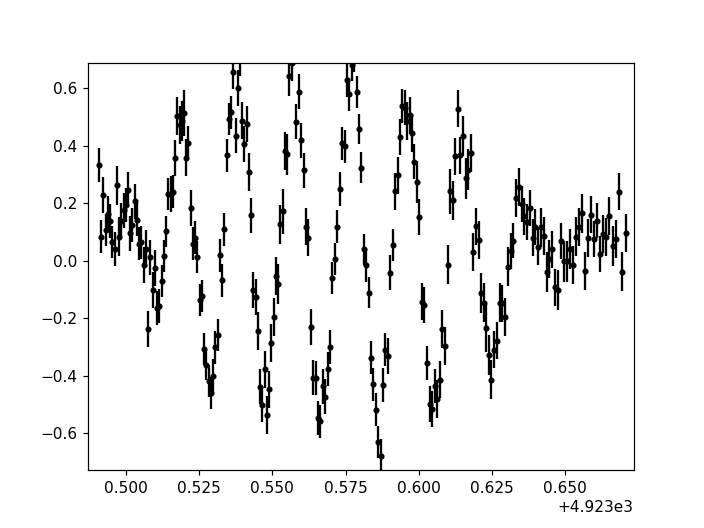

In [31]:
rv_data = np.loadtxt(par_dir + "/data/rv_betapic_carine.txt",usecols=(0,1,2))
rv_time = rv_data[:,0]
rv_flux = rv_data[:,1]
rv_error = rv_data[:,2]
plt.figure()
plt.errorbar(rv_time,rv_flux,yerr=rv_error,fmt='ok',markersize=3,capsize=0)
plt.show()